# 1. Data Collection:

> Import Libraries

In [57]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import LabelEncoder

viridis_colors = sns.color_palette("viridis", n_colors=10).as_hex()

> Loading Dataset

In [58]:
sales = pd.read_csv('../Data/Original Data.csv', encoding='latin-1')
sales.shape

(51290, 24)

> Discribe Dataset

In [59]:
sales.describe()

,Row ID,Postal Code,Sales,Quantity,Discount,Profit,Shipping Cost
count,51290.00000,9994.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,25645.50000,55190.379428,246.490581,3.476545,0.142908,28.610982,26.375915
std,14806.29199,32063.693350,487.565361,2.278766,0.212280,174.340972,57.296804
min,1.00000,1040.000000,0.444000,1.000000,0.000000,-6599.978000,0.000000
25%,12823.25000,23223.000000,30.758625,2.000000,0.000000,0.000000,2.610000
50%,25645.50000,56430.500000,85.053000,3.000000,0.000000,9.240000,7.790000
75%,38467.75000,90008.000000,251.053200,5.000000,0.200000,36.810000,24.450000
max,51290.00000,99301.000000,22638.480000,14.000000,0.850000,8399.976000,933.570000


> Drop useless Columns

In [60]:
sales.drop(columns=['Row ID' ,'Order ID' ,'Customer ID','Postal Code','Product ID'] ,inplace=True)

In [61]:
# Convert Order Date to DateTime
sales['Order Date'] = pd.to_datetime(sales['Order Date'], dayfirst=True)

# Convert Ship Date to Date time
sales['Ship Date'] = pd.to_datetime(sales['Ship Date'], dayfirst=True)

> Add the missed featuers

In [62]:
from pandas.tseries.holiday import USFederalHolidayCalendar

sales['Month'] = sales['Order Date'].dt.month
sales['Quarter'] = sales['Order Date'].dt.quarter 
sales['Year'] = sales['Order Date'].dt.year
sales['Day_of_Week'] = sales['Order Date'].dt.dayofweek
sales['Is_Weekend'] = sales['Day_of_Week'].isin([5, 6]).astype(int)  # 5 and 6 correspond to Fri and Sat

# Add holiday feature
cal = USFederalHolidayCalendar()
holidays = cal.holidays(start=sales['Order Date'].min(), end=sales['Order Date'].max())
sales['Is_Holiday'] = sales['Order Date'].isin(holidays).astype(int)

# Add season feature
sales['Season'] = sales['Month'].apply(lambda x: 'Winter' if x in [12, 1, 2] else
                                                'Spring' if x in [3, 4, 5] else
                                                'Summer' if x in [6, 7, 8] else
                                                'Fall')
sales['Season'] = sales['Season'].astype('category')

# Add total sales feature
sales['Total_sales'] = (sales['Sales']) * (sales['Quantity'])

# 2. Data Exploration:

### • Investigate relationships between product types, promotional activities, and sales volume. In addition to understanding sales trends, seasonality, and external factors influencing demand.

> 1. Number of records in the dataset

In [63]:
num_records = sales.shape[0]
print(f"> Number of records in the dataset: {num_records}")

> Number of records in the dataset: 51290


> 2. Total sales revenue

In [64]:
total_sales = sales['Sales'].sum()
print(f"> Total Sales Revenue: ${total_sales:,.2f}")

> Total Sales Revenue: $12,642,501.91


> 3. Total profit

In [65]:
total_profit = sales['Profit'].sum()
print(f"> Total Profit: ${total_profit:,.2f}")

> Total Profit: $1,467,457.29


> 4. Total discounts given

In [66]:
total_discounts = sales['Discount'].sum()
print(f"> Total Discounts Given: {total_discounts:.2f}")

> Total Discounts Given: 7329.73


> 5. Average sales per order

In [67]:
average_sales = sales['Sales'].mean()
print(f"> Average Sales per Order: ${average_sales:.2f}")

> Average Sales per Order: $246.49


> 6. Highest selling category

In [68]:
category_sales = sales.groupby('Category')['Sales'].sum().round(2).sort_values(ascending=False)
category_sales = pd.DataFrame(category_sales).reset_index()
category_sales.index += 1
category_sales

,Category,Sales
1,Technology,4744557.50
2,Furniture,4110874.19
3,Office Supplies,3787070.23


> 7. Highest selling sub-category

In [69]:
subcategory_sales = sales.groupby('Sub-Category')['Sales'].sum().sort_values(ascending=False)
subcategory_sales = pd.DataFrame(subcategory_sales).reset_index()
subcategory_sales.index += 1
subcategory_sales.head()

,Sub-Category,Sales
1,Phones,1.706824e+06
2,Copiers,1.509436e+06
3,Chairs,1.501682e+06
4,Bookcases,1.466572e+06
5,Storage,1.127086e+06


> 8. Most sold sub-category by quantity

In [70]:
subcategory_quantity = sales.groupby('Sub-Category')['Quantity'].sum().sort_values(ascending=False)
subcategory_quantity = pd.DataFrame(subcategory_quantity).reset_index()
subcategory_quantity.index +=1
subcategory_quantity.head()

,Sub-Category,Quantity
1,Binders,21429
2,Storage,16917
3,Art,16301
4,Paper,12822
5,Chairs,12336


> 9. Impact of discounts on sales

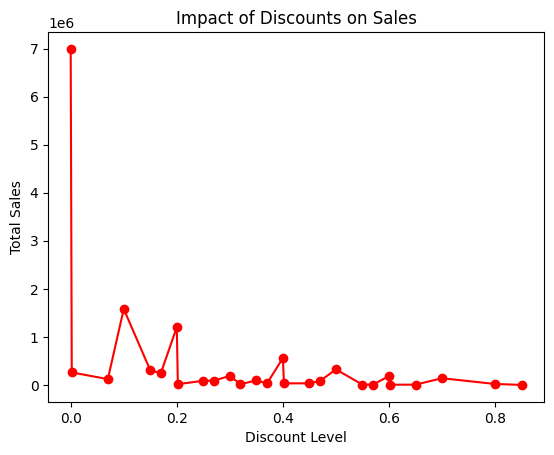

In [71]:
discount_impact = sales.groupby('Discount')['Sales'].sum()
plt.plot(discount_impact.index, discount_impact.values, marker='o', color='red')
plt.xlabel('Discount Level')
plt.ylabel('Total Sales')
plt.title('Impact of Discounts on Sales')
plt.show()

> 10. Preferred shipping mode

In [72]:
shipping_mode = sales['Ship Mode'].value_counts()
shipping_mode = pd.DataFrame(shipping_mode)
shipping_mode

,count
Ship Mode,
Standard Class,30775
Second Class,10309
First Class,7505
Same Day,2701


> 11. Sales performance by region

In [73]:
region_sales = sales.groupby('Region')['Sales'].sum().round(2).sort_values(ascending=False)
region_sales = pd.DataFrame(region_sales)
region_sales

,Sales
Region,
Central,2822302.52
South,1600907.04
North,1248165.60
Oceania,1100184.61
Southeast Asia,884423.17
North Asia,848309.78
EMEA,806161.31
Africa,783773.21
Central Asia,752826.57


> 12. Profit distribution across regions

In [74]:
region_profit = sales.groupby('Region')['Profit'].sum().round(2).sort_values(ascending=False)
region_profit = pd.DataFrame(region_profit)
region_profit

,Profit
Region,
Central,311403.98
North,194597.95
North Asia,165578.42
South,140355.77
Central Asia,132480.19
Oceania,120089.11
West,108418.45
East,91522.78
Africa,88871.63


> 13. Top 5 most profitable products

In [75]:
top_profitable_products = sales.groupby('Product Name')['Profit'].sum().round(2).sort_values(ascending=False).head()
top_profitable_products = pd.DataFrame(top_profitable_products).reset_index()
top_profitable_products.index += 1
top_profitable_products

,Product Name,Profit
1,Canon imageCLASS 2200 Advanced Copier,25199.93
2,"Cisco Smart Phone, Full Size",17238.52
3,"Motorola Smart Phone, Full Size",17027.11
4,"Hoover Stove, Red",11807.97
5,"Sauder Classic Bookcase, Traditional",10672.07


> 14. Top 5 least profitable products

In [76]:
least_profitable_products = sales.groupby('Product Name')['Profit'].sum().sort_values().head(5)
least_profitable_products = pd.DataFrame(least_profitable_products).reset_index()
least_profitable_products.index += 1
least_profitable_products

,Product Name,Profit
1,Cubify CubeX 3D Printer Double Head Print,-8879.9704
2,Lexmark MX611dhe Monochrome Laser Printer,-4589.9730
3,"Motorola Smart Phone, Cordless",-4447.0380
4,Cubify CubeX 3D Printer Triple Head Print,-3839.9904
5,"Bevis Round Table, Adjustable Height",-3649.8940


> 15. Top 10 Customers by Total Sales

In [77]:
customer_sales = sales.groupby('Customer Name')['Sales'].sum().round(2).sort_values(ascending=False).head(10)
customer_sales = pd.DataFrame(customer_sales).reset_index()
customer_sales.index += 1
print("Top 10 Customers by Total Sales:")
customer_sales

Top 10 Customers by Total Sales:


,Customer Name,Sales
1,Tom Ashbrook,40488.07
2,Tamara Chand,37457.33
3,Greg Tran,35550.95
4,Christopher Conant,35187.08
5,Sean Miller,35170.93
6,Bart Watters,32310.45
7,Natalie Fritzler,31781.26
8,Fred Hopkins,30400.67
9,Jane Waco,30288.45
10,Hunter Lopez,30243.57


> 16. Average order value per region

In [78]:
region_avg_order = sales.groupby('Region')['Sales'].mean().round(2).sort_values(ascending=False)
region_avg_order = pd.DataFrame(region_avg_order)
region_avg_order

,Sales
Region,
Central Asia,367.59
North Asia,362.84
Oceania,315.51
Southeast Asia,282.65
North,260.85
Central,253.87
South,240.92
East,238.34
West,226.49


> 17. Relationship between sales and profit

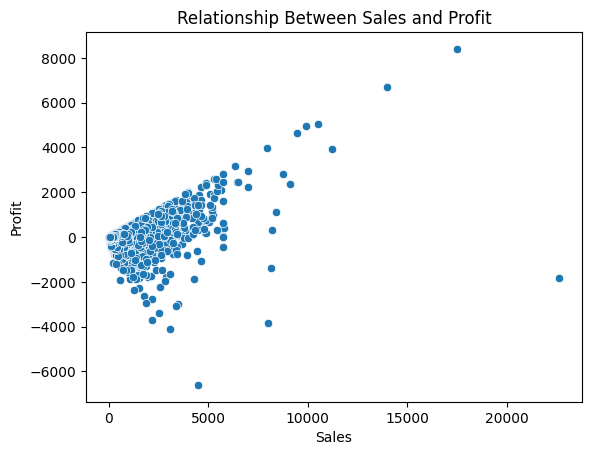

In [79]:
sns.scatterplot(x = sales['Sales'], y = sales['Profit'])
plt.xlabel('Sales')
plt.ylabel('Profit')
plt.title('Relationship Between Sales and Profit')
plt.show()

> 18. Monthly sales trends

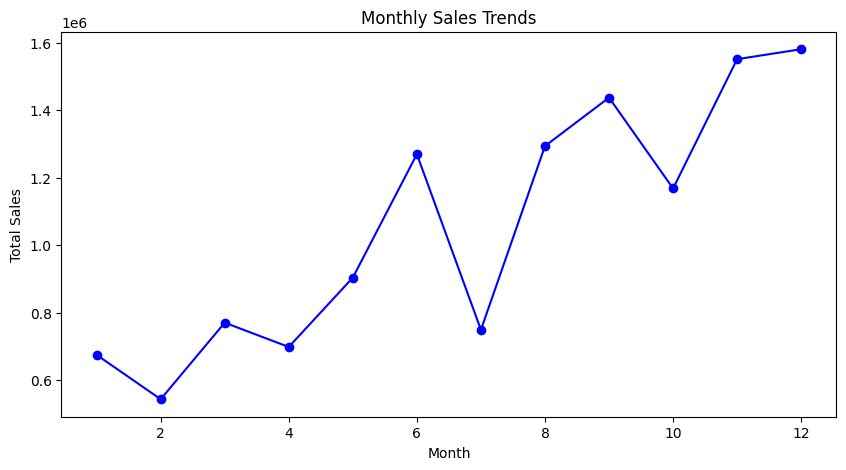

In [80]:
monthly_sales = sales.groupby('Month')['Sales'].sum()

plt.figure(figsize=(10, 5))
monthly_sales.plot(marker='o', linestyle='-', color='blue')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.title('Monthly Sales Trends')
plt.show()

> 19. Sales contribution by customer segment

In [81]:
segment_sales = sales.groupby('Segment')['Sales'].sum().round(2).sort_values(ascending=False)
segment_sales = pd.DataFrame(segment_sales)
segment_sales

,Sales
Segment,
Consumer,6507949.42
Corporate,3824697.52
Home Office,2309854.97


> 20. Impact of shipping mode on profit

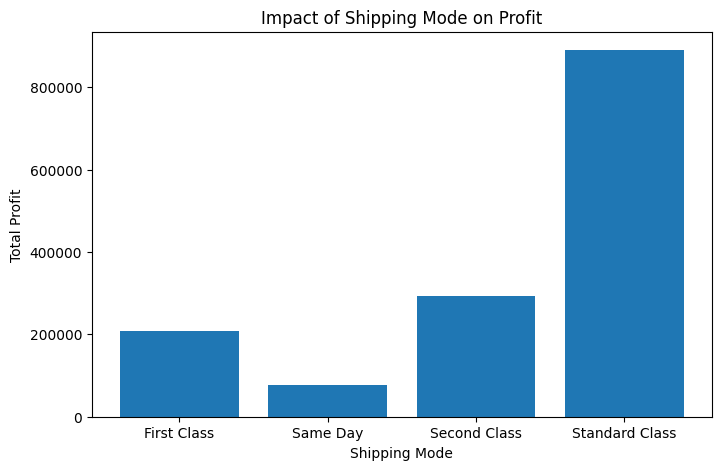

In [82]:
shipping_profit = sales.groupby('Ship Mode')['Profit'].sum()
plt.figure(figsize=(8, 5))
plt.bar(shipping_profit.index, shipping_profit.values)
plt.xlabel('Shipping Mode')
plt.ylabel('Total Profit')
plt.title('Impact of Shipping Mode on Profit')
plt.show()

> 21. Identify the average discount applied per category

In [83]:
avg_discount_category = sales.groupby('Category')['Discount'].mean().round(4)
avg_discount_category = pd.DataFrame(avg_discount_category)
avg_discount_category

,Discount
Category,
Furniture,0.1681
Office Supplies,0.1374
Technology,0.1353


> 22. Identify the most frequently purchased product

In [84]:
most_frequent_product = sales['Product Name'].value_counts().idxmax()
print(f"> Most Frequently Purchased Product: {most_frequent_product}")

> Most Frequently Purchased Product: Staples


> 23. Identify top 5 cities with highest sales

In [85]:
top_cities_sales = sales.groupby('City')['Sales'].sum().round(2).sort_values(ascending=False).head(5)
top_cities_sales = pd.DataFrame(top_cities_sales).reset_index()
top_cities_sales.index += 1
print("Top 5 Cities with Highest Sales:")
top_cities_sales

Top 5 Cities with Highest Sales:


,City,Sales
1,New York City,256368.16
2,Los Angeles,175851.34
3,Manila,120886.95
4,Seattle,119540.74
5,San Francisco,112669.09


> 24. Compare sales & profit on holidays vs. non-holidays

In [86]:
holiday_impact = sales.groupby("Is_Holiday")[["Sales", "Profit"]].mean().round(2)
holiday_impact = pd.DataFrame(holiday_impact)
print("Average Sales & Profit: Holiday vs. Non-Holiday:")
holiday_impact

Average Sales & Profit: Holiday vs. Non-Holiday:


,Sales,Profit
Is_Holiday,,
0,245.72,28.42
1,267.77,33.93


> 25. Compare weekend vs. weekday sales

In [87]:
weekend_impact = sales.groupby("Is_Weekend")[["Sales", "Profit"]].mean().round(3)
weekend_impact = pd.DataFrame(weekend_impact)
print("Average Sales & Profit: Weekend vs. Weekday:")
weekend_impact

Average Sales & Profit: Weekend vs. Weekday:


,Sales,Profit
Is_Weekend,,
0,245.893,28.444
1,251.395,29.986


> 26. The top 5 best-selling products

In [88]:
top_products = sales.groupby("Product Name")["Quantity"].sum().sort_values(ascending=False).head(5)
top_products = pd.DataFrame(top_products)
print("\nTop 5 Most Ordered Products:\n")
top_products


Top 5 Most Ordered Products:



,Quantity
Product Name,
Staples,876
"Cardinal Index Tab, Clear",337
"Eldon File Cart, Single Width",321
"Rogers File Cart, Single Width",262
"Sanford Pencil Sharpener, Water Color",259


> 27. The least sold products

In [89]:
least_products = sales.groupby("Product Name")["Quantity"].sum().sort_values().head(5)
least_products = pd.DataFrame(least_products)
print("\nLeast Ordered Products:\n") 
least_products


Least Ordered Products:



,Quantity
Product Name,
Global Enterprise Series Seating Low-Back Swivel/Tilt Chairs,1
"Bush Saratoga Collection 5-Shelf Bookcase, Hanover Cherry, *Special Order",1
Boston 1900 Electric Pencil Sharpener,1
"Chromcraft Training Table, Adjustable Height",1
Penpower WorldCard Pro Card Scanner,1


> 28. Compare profit for discounted vs. non-discounted sales

In [90]:
discount_impact = sales.groupby(sales["Discount"] > 0)["Profit"].mean().round(2)
discount_impact = pd.DataFrame(discount_impact)
print("\nAverage Profit for Discounted vs. Non-Discounted Sales:\n")
discount_impact


Average Profit for Discounted vs. Non-Discounted Sales:



,Profit
Discount,
False,61.04
True,-13.61


> 29. Average shipping cost per season 

In [91]:
seasonal_shipping = sales.groupby("Season", observed=False)["Shipping Cost"].mean().sort_values(ascending=False)
seasonal_shipping = pd.DataFrame(seasonal_shipping)
print("\nAverage Shipping Cost by Season:\n")
seasonal_shipping


Average Shipping Cost by Season:



,Shipping Cost
Season,
Winter,27.285037
Fall,26.265491
Summer,26.255096
Spring,25.708465


> 30. States with highest shipping costs

In [92]:
high_shipping_states = sales.groupby("State")["Shipping Cost"].mean().sort_values(ascending=False).head(5)
high_shipping_states = pd.DataFrame(high_shipping_states)
print("\nStates with Highest Average Shipping Cost:\n")
high_shipping_states


States with Highest Average Shipping Cost:



,Shipping Cost
State,
Paysandú,634.530
Elbasan,301.730
Hidalgo,229.865
Bekes,190.315
Sikasso,184.600


> 33. Compare average monthly & quarterly sales

In [93]:
avg_monthly_sales = sales.groupby("Month")["Sales"].mean().sort_values(ascending=False)
avg_monthly_sales = pd.DataFrame(avg_monthly_sales)
avg_quarterly_sales = sales.groupby("Quarter")["Sales"].sum().sort_values(ascending=False)
avg_quarterly_sales = pd.DataFrame(avg_quarterly_sales)

print("\nAverage Sales by Month:\n")
avg_monthly_sales


Average Sales by Month:



,Sales
Month,
10,260.174696
1,259.766707
8,254.791880
3,253.871809
12,250.837952
2,250.802297
11,244.603807
5,241.262967
9,240.565709


In [94]:
print("\nAverage Sales by Quarter:\n")
avg_quarterly_sales


Average Sales by Quarter:



,Sales
Quarter,
4,4.300243e+06
3,3.480595e+06
2,2.872290e+06
1,1.989374e+06


> 34. Fastest and Slowest deliveries

In [95]:


sales["Shipping Time (Days)"] = (sales["Ship Date"] - sales["Order Date"]).dt.days

# Find fastest and slowest deliveries
fastest_shipping = sales.sort_values(by="Shipping Time (Days)").head(5)
slowest_shipping = sales.sort_values(by="Shipping Time (Days)", ascending=False).head(5)

print("\nTop 5 Fastest Shipped Orders:\n")
fastest_shipping[["Order Date", "Ship Date", "Ship Mode", "Shipping Time (Days)"]]



Top 5 Fastest Shipped Orders:



,Order Date,Ship Date,Ship Mode,Shipping Time (Days)
36,2011-09-14,2011-09-14,Same Day,0
2658,2013-09-19,2013-09-19,Same Day,0
2654,2013-07-12,2013-07-12,Same Day,0
45620,2014-05-05,2014-05-05,Same Day,0
45611,2011-03-17,2011-03-17,Same Day,0


In [96]:
print("\nTop 5 Slowest Shipped Orders:\n")
slowest_shipping[["Order Date", "Ship Date", "Ship Mode", "Shipping Time (Days)"]]


Top 5 Slowest Shipped Orders:



,Order Date,Ship Date,Ship Mode,Shipping Time (Days)
34981,2012-11-03,2012-11-10,Standard Class,7
34932,2014-12-25,2015-01-01,Standard Class,7
34962,2011-12-03,2011-12-10,Standard Class,7
40926,2013-12-27,2014-01-03,Standard Class,7
34993,2012-02-14,2012-02-21,Standard Class,7


### • Handle missing values, duplicates, and outliers, and compute basic summary statistics.

#### - Handle Missing Values

> identifying missing values

In [97]:
missing_values = pd.DataFrame(sales.isna().sum())
missing_values

,0
Order Date,0
Ship Date,0
Ship Mode,0
Customer Name,0
Segment,0
City,0
State,0
Country,0
Market,0
Region,0


#### - Handle Duplicates values

>Identifying Duplicates Values

In [98]:
duplicates_values = sales.duplicated().sum()
print(f"Number of Duplicates Values = {duplicates_values}")

Number of Duplicates Values = 0


#### - Identify Outliers

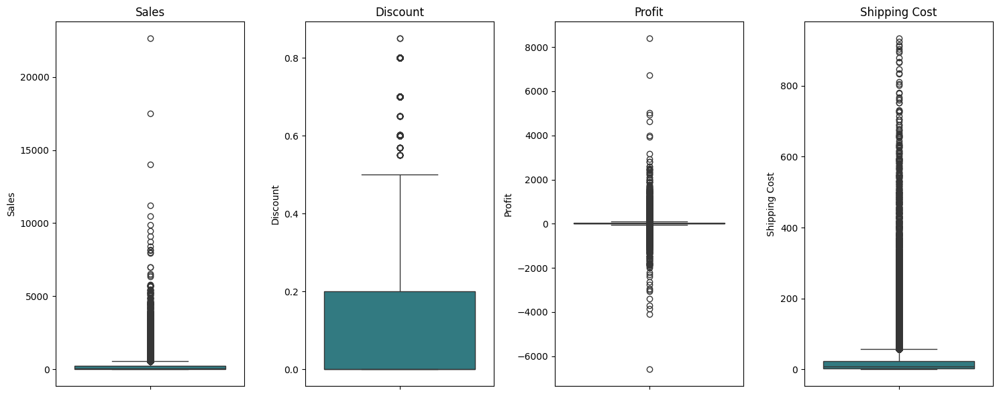

Outliers In Each Column: {'Sales': 5655, 'Discount': 4172, 'Profit': 9755, 'Shipping Cost': 5909}


In [99]:
numeric_columns = ["Sales", "Discount", "Profit", "Shipping Cost"]

# Plot Outliers in each numerical column
plt.figure(figsize=(15, 6))
for i, col in enumerate(numeric_columns, 1):
    plt.subplot(1, len(numeric_columns), i)
    sns.boxplot(y=sales[col], color=viridis_colors[4])
    plt.title(col)

plt.tight_layout()
plt.show()

# Calculate IQR
outliers = {}
for col in numeric_columns:
    Q1 = sales[col].quantile(0.25)
    Q3 = sales[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers[col] = sales[(sales[col] < lower_bound) | (sales[col] > upper_bound)].shape[0]

print("Outliers In Each Column:", outliers)

#### - Basic summary statistics

>Summary statistics for numerical features

In [100]:
sales.describe(include=['number'])

,Sales,Quantity,Discount,Profit,Shipping Cost,Month,Quarter,Year,Day_of_Week,Is_Weekend,Is_Holiday,Total_sales,Shipping Time (Days)
count,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000
mean,246.490581,3.476545,0.142908,28.610982,26.375915,7.522636,2.793235,2012.777208,2.343264,0.108598,0.034900,1205.327987,3.969370
std,487.565361,2.278766,0.212280,174.340972,57.296804,3.300056,1.066015,1.098931,1.671486,0.311137,0.183527,3452.079528,1.729437
min,0.444000,1.000000,0.000000,-6599.978000,0.000000,1.000000,1.000000,2011.000000,0.000000,0.000000,0.000000,0.444000,0.000000
25%,30.758625,2.000000,0.000000,0.000000,2.610000,5.000000,2.000000,2012.000000,1.000000,0.000000,0.000000,66.930000,3.000000
50%,85.053000,3.000000,0.000000,9.240000,7.790000,8.000000,3.000000,2013.000000,2.000000,0.000000,0.000000,245.772000,4.000000
75%,251.053200,5.000000,0.200000,36.810000,24.450000,10.000000,4.000000,2014.000000,4.000000,0.000000,0.000000,904.875000,5.000000
max,22638.480000,14.000000,0.850000,8399.976000,933.570000,12.000000,4.000000,2014.000000,6.000000,1.000000,1.000000,135830.880000,7.000000


In [101]:
Basic_Statistics = sales.describe(include=['number']).T
Basic_Statistics['skew'] = sales.select_dtypes(include=['number']).apply(lambda x: x.skew())
Basic_Statistics['kurt'] = sales.select_dtypes(include=['number']).apply(lambda x: x.kurt())
Basic_Statistics['median'] = sales.select_dtypes(include=['number']).apply(lambda x: x.median())
Basic_Statistics['variance'] = sales.select_dtypes(include=['number']).apply(lambda x: x.var())
Basic_Statistics['mode'] = sales.select_dtypes(include=['number']).apply(lambda x: x.mode().values[0])
Basic_Statistics['range'] = Basic_Statistics['max'] - Basic_Statistics['min']
Basic_Statistics = Basic_Statistics[['count', 'mean', 'std', 'skew', 'kurt', 'min', '25%', '50%', '75%', 'max', 'range', 'mode', 'variance']]
Basic_Statistics

,count,mean,std,skew,kurt,min,25%,50%,75%,max,range,mode,variance
Sales,51290.0,246.490581,487.565361,8.138080,176.731200,0.444,30.758625,85.053,251.0532,22638.480,22638.036,12.96,2.377200e+05
Quantity,51290.0,3.476545,2.278766,1.360368,2.275889,1.000,2.000000,3.000,5.0000,14.000,13.000,2.00,5.192776e+00
Discount,51290.0,0.142908,0.212280,1.387775,0.716682,0.000,0.000000,0.000,0.2000,0.850,0.850,0.00,4.506277e-02
Profit,51290.0,28.610982,174.340972,4.157189,291.411090,-6599.978,0.000000,9.240,36.8100,8399.976,14999.954,0.00,3.039477e+04
Shipping Cost,51290.0,26.375915,57.296804,5.863226,50.020158,0.000,2.610000,7.790,24.4500,933.570,933.570,0.86,3.282924e+03
Month,51290.0,7.522636,3.300056,-0.357971,-0.977879,1.000,5.000000,8.000,10.0000,12.000,11.000,11.00,1.089037e+01
Quarter,51290.0,2.793235,1.066015,-0.334947,-1.160328,1.000,2.000000,3.000,4.0000,4.000,3.000,4.00,1.136389e+00
Year,51290.0,2012.777208,1.098931,-0.344515,-1.222033,2011.000,2012.000000,2013.000,2014.0000,2014.000,3.000,2014.00,1.207650e+00
Day_of_Week,51290.0,2.343264,1.671486,0.159972,-1.040707,0.000,1.000000,2.000,4.0000,6.000,6.000,4.00,2.793864e+00
Is_Weekend,51290.0,0.108598,0.311137,2.516040,4.330626,0.000,0.000000,0.000,0.0000,1.000,1.000,0.00,9.680649e-02


>Summary statistics for categorical features

In [102]:
sales.describe(include=['object', 'category'])

,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,Category,Sub-Category,Product Name,Order Priority,Season
count,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290
unique,4,795,3,3636,1094,147,7,13,3,17,3788,4,4
top,Standard Class,Muhammed Yedwab,Consumer,New York City,California,United States,APAC,Central,Office Supplies,Binders,Staples,Medium,Fall
freq,30775,108,26518,915,2001,9994,11002,11117,31273,6152,227,29433,16807


>Summary statistics for datetime features

In [103]:
sales.describe(include=['datetime'])

,Order Date,Ship Date
count,51290,51290
mean,2013-05-11 21:26:49.155781120,2013-05-15 20:42:42.745174528
min,2011-01-01 00:00:00,2011-01-03 00:00:00
25%,2012-06-19 00:00:00,2012-06-23 00:00:00
50%,2013-07-08 00:00:00,2013-07-12 00:00:00
75%,2014-05-22 00:00:00,2014-05-26 00:00:00
max,2014-12-31 00:00:00,2015-01-07 00:00:00


>Summary statistics for all features

In [104]:
sales.describe(include='all')

,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Order Priority,Month,Quarter,Year,Day_of_Week,Is_Weekend,Is_Holiday,Season,Total_sales,Shipping Time (Days)
count,51290,51290,51290,51290,51290,51290,51290,51290,51290,51290,...,51290,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290.000000,51290,51290.000000,51290.000000
unique,NaN,NaN,4,795,3,3636,1094,147,7,13,...,4,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN
top,NaN,NaN,Standard Class,Muhammed Yedwab,Consumer,New York City,California,United States,APAC,Central,...,Medium,NaN,NaN,NaN,NaN,NaN,NaN,Fall,NaN,NaN
freq,NaN,NaN,30775,108,26518,915,2001,9994,11002,11117,...,29433,NaN,NaN,NaN,NaN,NaN,NaN,16807,NaN,NaN
mean,2013-05-11 21:26:49.155781120,2013-05-15 20:42:42.745174528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,7.522636,2.793235,2012.777208,2.343264,0.108598,0.034900,NaN,1205.327987,3.969370
min,2011-01-01 00:00:00,2011-01-03 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.000000,1.000000,2011.000000,0.000000,0.000000,0.000000,NaN,0.444000,0.000000
25%,2012-06-19 00:00:00,2012-06-23 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,5.000000,2.000000,2012.000000,1.000000,0.000000,0.000000,NaN,66.930000,3.000000
50%,2013-07-08 00:00:00,2013-07-12 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,8.000000,3.000000,2013.000000,2.000000,0.000000,0.000000,NaN,245.772000,4.000000
75%,2014-05-22 00:00:00,2014-05-26 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,10.000000,4.000000,2014.000000,4.000000,0.000000,0.000000,NaN,904.875000,5.000000
max,2014-12-31 00:00:00,2015-01-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,12.000000,4.000000,2014.000000,6.000000,1.000000,1.000000,NaN,135830.880000,7.000000


# 3. Exploratory Data Analysis (EDA):

### • General Sales Analysis

> Sales Distribution
- Higher sales have low frequency
- Sales mostly concentrated in low sales from  0.444  to  251.05

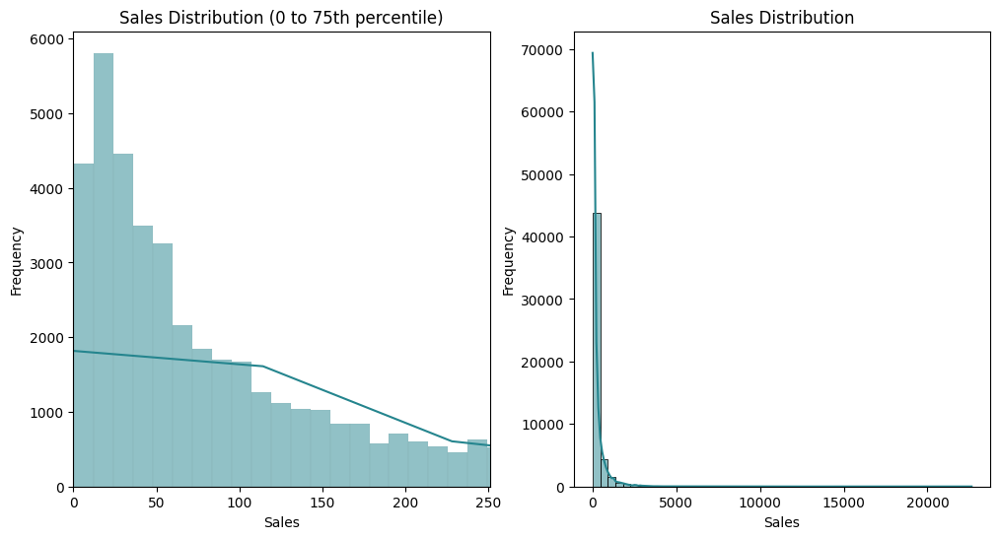

In [105]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

sns.histplot(sales['Sales'], kde=True, ax=axes[0],color=viridis_colors[4])
axes[0].set_xlim(0, sales['Sales'].quantile(0.75))
axes[0].set_title('Sales Distribution (0 to 75th percentile)')
axes[0].set_xlabel('Sales')
axes[0].set_ylabel('Frequency')

sns.histplot(sales['Sales'], kde=True, ax=axes[1], color=viridis_colors[4] ,bins = 50)
axes[1].set_title('Sales Distribution')
axes[1].set_xlabel('Sales')
axes[1].set_ylabel('Frequency')
plt.show()

> Identifies outliers, median sales, and interquartile ranges.
- sales min value :  0.444
- 25% of sales :  30.758
- sales median value :  85.053
- 75% of sales :  251.053
- sales max value :  22638.48

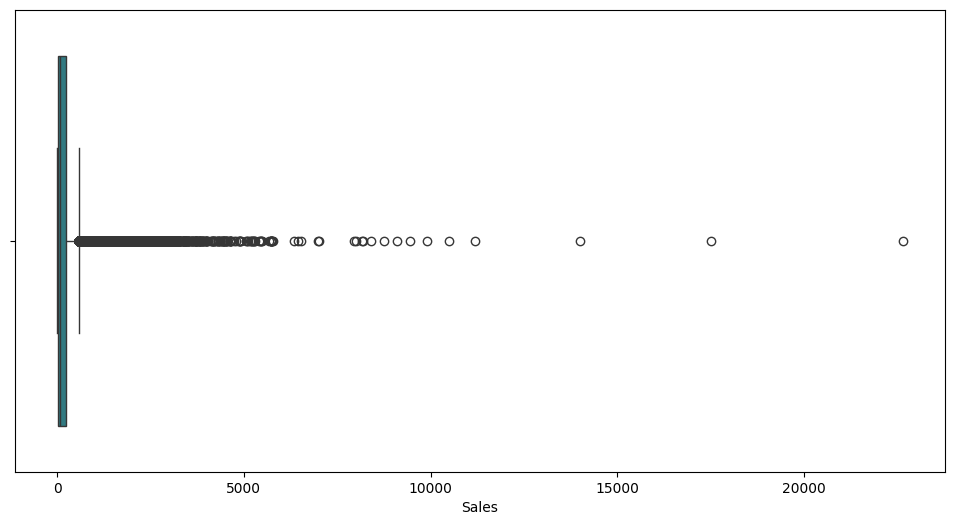

In [106]:
plt.figure(figsize=((12,6)))
sns.boxplot(sales, x='Sales', color=viridis_colors[4])
plt.show()


> Monthly Sales Trends Over Years
- Sales Growth: Increasing trend over the years, with 2014 having the highest sales.
- Seasonal Patterns: Peaks in June, August, and December, dips in July and October.
- Yearly Trends: 2011 had the lowest sales, while 2014 saw the strongest performance.

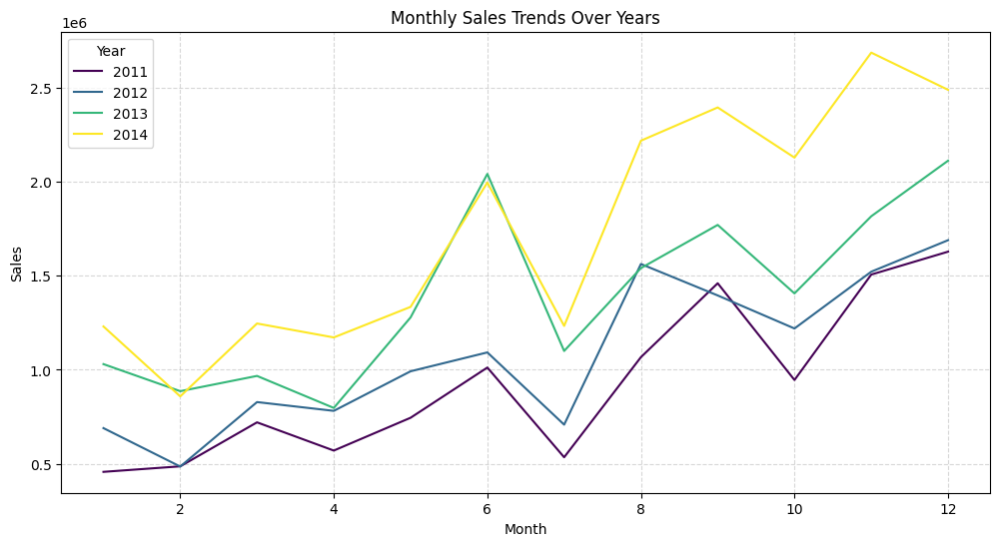

In [107]:
monthly_sales = sales.groupby(['Year', 'Month'])['Total_sales'].sum().reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sales, x='Month', y='Total_sales', hue='Year', palette='viridis')
plt.title('Monthly Sales Trends Over Years')
plt.xlabel('Month')
plt.ylabel('Sales')
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()



> Total sales over 4 Years
- Growth: Sales have shown an overall upward trend from 2011 to 2014
- Seasonal Fluctuations: Sharp rises and falls suggest seasonal sales cycles, likely influenced by promotions

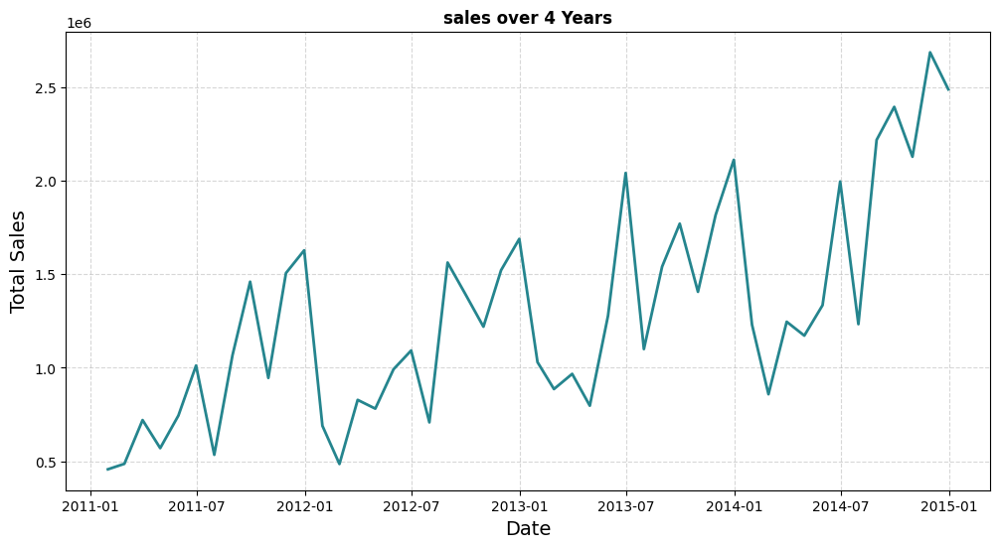

In [108]:
sales_ts = sales.groupby("Order Date")["Total_sales"].sum().resample("ME").sum()

plt.figure(figsize=(12, 6))
sns.lineplot(data=sales_ts, color=viridis_colors[4], linewidth=2)
plt.title("sales over 4 Years", fontweight="bold")
plt.xlabel("Date", fontsize=14)
plt.ylabel("Total Sales", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

> Impact of Discounts on Sales
- There is a negative correlation between discounts and total sales.
- Higher discounts (>0.4) tend to have lower sales, while sales are higher at lower discount levels (0-0.2).

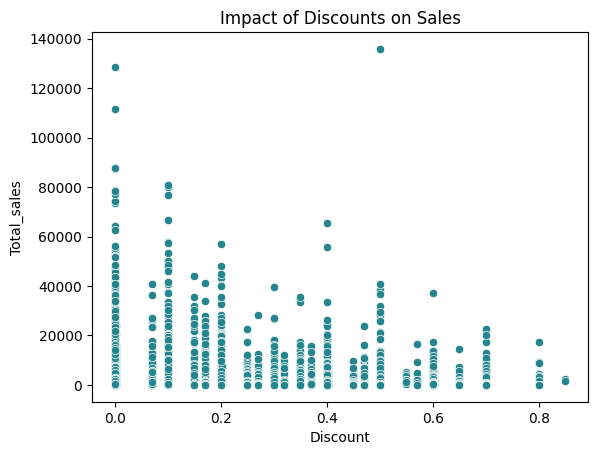

In [109]:
sns.scatterplot(x=sales['Discount'], y=sales['Total_sales'], color=viridis_colors[4])
plt.title("Impact of Discounts on Sales")
plt.show()

>  Analyze the relationship between discounts and Quantity
- Most sales occur at zero discount
- A huge portion of quantity sold happens at 0% discount, meaning many customers are willing to buy at full price.
- Noticeable increases in quantity sold occur at 10-20% and around 40% discount levels.
- This might indicate that these discount are the most effective in driving purchases.
- Higher discounts (above 50%) don’t lead to massive sales growth

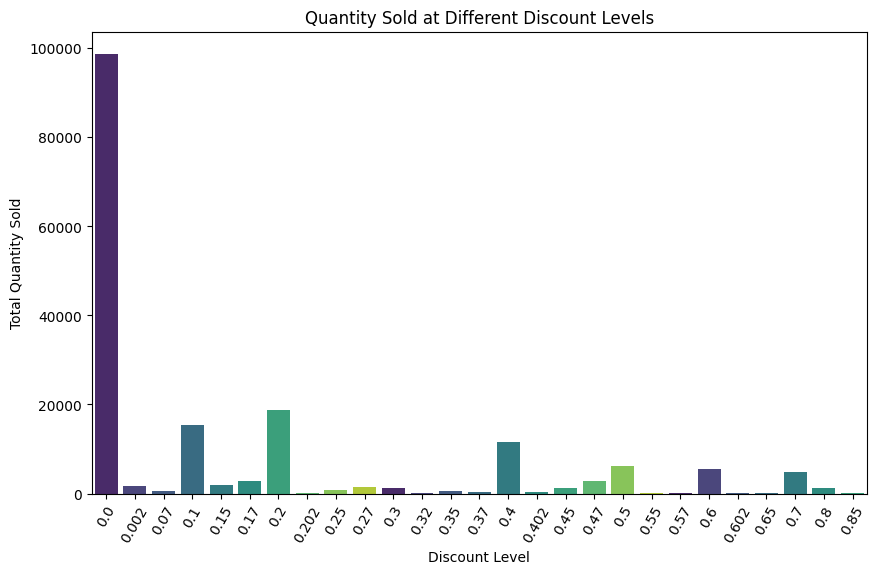

In [110]:
discount_quantity = sales.groupby('Discount')['Quantity'].sum().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='Discount', y='Quantity', data=discount_quantity, palette=viridis_colors)
plt.xlabel('Discount Level')
plt.ylabel('Total Quantity Sold')
plt.title('Quantity Sold at Different Discount Levels')
plt.xticks(rotation=60)
plt.show()

- Holiday sales are slightly higher than non-holiday sales.
- This indicates that while holidays boost sales, the increase is not very significant.

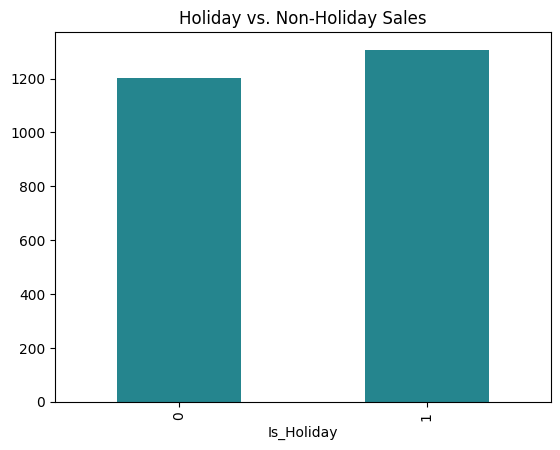

In [111]:
sales.groupby('Is_Holiday')['Total_sales'].mean().plot(kind='bar', title='Holiday vs. Non-Holiday Sales', color=viridis_colors[4])
plt.show()

> Total Sales by Day of the Week
- Highest sales occur on weekdays (Tus-Fri)
- Sales drop sharply on weekends, especially on Sunday.

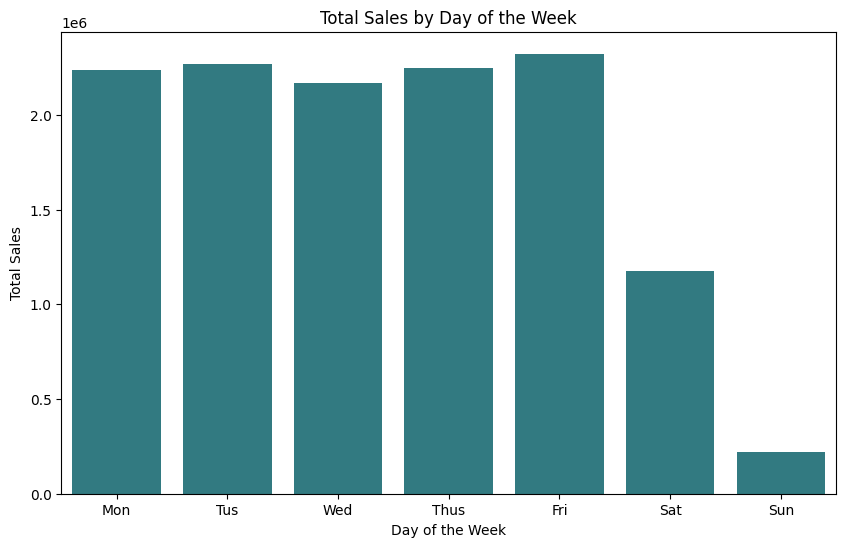

In [112]:
sales_by_day = sales.groupby('Day_of_Week')['Sales'].sum().reset_index()

plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Day_of_Week', y='Sales', data=sales_by_day, color = viridis_colors[4])
ax.set_xticklabels(['Mon', 'Tus', 'Wed', 'Thus', 'Fri', 'Sat', 'Sun'])
plt.title('Total Sales by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Total Sales')
plt.show()

> Season Total Sales
- Fall has the highest sales.
- Spring shows the lowest sales.
- Summer and Winter have moderate sales.

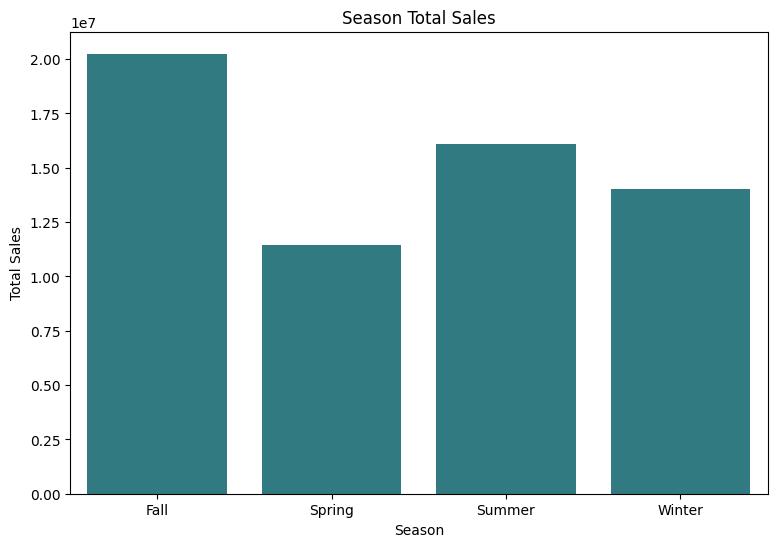

In [113]:
seasonal_sales = sales.groupby('Season')['Total_sales'].sum().reset_index()

plt.figure(figsize=(9, 6))
sns.barplot(x='Season', y='Total_sales', data=seasonal_sales, color=viridis_colors[4])
plt.title('Season Total Sales')
plt.xlabel('Season')
plt.ylabel('Total Sales')
plt.show()

> Compare total sales across different product categories
- Technology has the highest sales then Furniture then office supplies
- but should be the highest sales Category be the highest profit, let's check

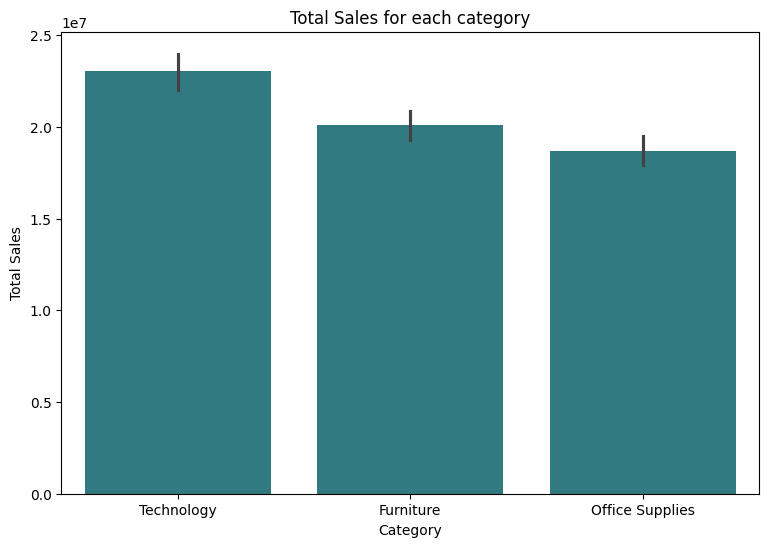

In [114]:
plt.figure(figsize=((9,6)))
sns.barplot(sales, x='Category', y='Total_sales', estimator=sum, color=viridis_colors[4])
plt.title('Total Sales for each category')
plt.xlabel('Category')
plt.ylabel('Total Sales')
plt.show()

> Compare total Profit across different product categories
- We see that the furniture was second on total sales
- But it the lowest on the profit may be because discounts was high so profit will be less

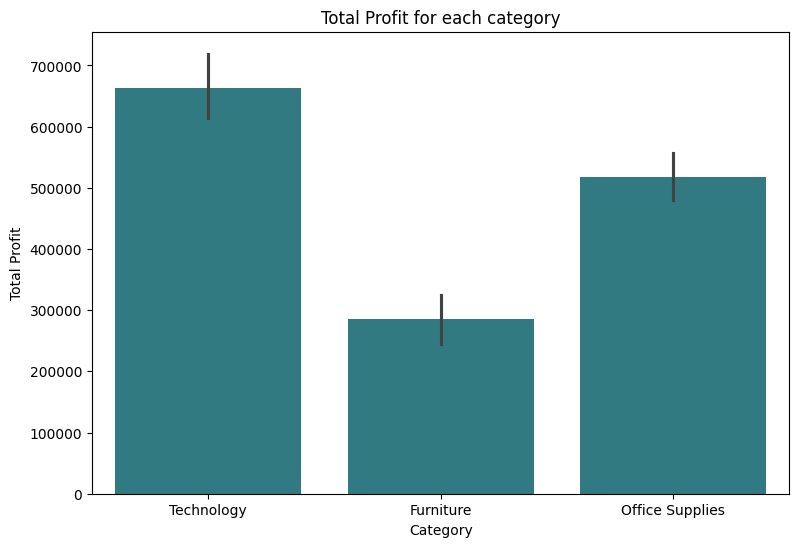

In [115]:
plt.figure(figsize=((9,6)))
sns.barplot(sales, x='Category', y='Profit', estimator=sum, color=viridis_colors[4])
plt.title('Total Profit for each category')
plt.xlabel('Category')
plt.ylabel('Total Profit')
plt.show()

> Compare total sales across different customer segments

In [116]:
fig = px.pie(sales,names='Segment', values='Total_sales',
             title='Total sales for each category', color_discrete_sequence =viridis_colors)
fig.show()

### • Product Analysis

- Highest Sales: Categories like Phones, Chairs, and Tables have the highest performance.
- Lowest Sales: Categories like Art, Envelopes, and Labels need improvement.
- Uneven Distribution: Significant variation in sales across categories.
- Improvement Opportunities: Focus on weak categories to enhance them.

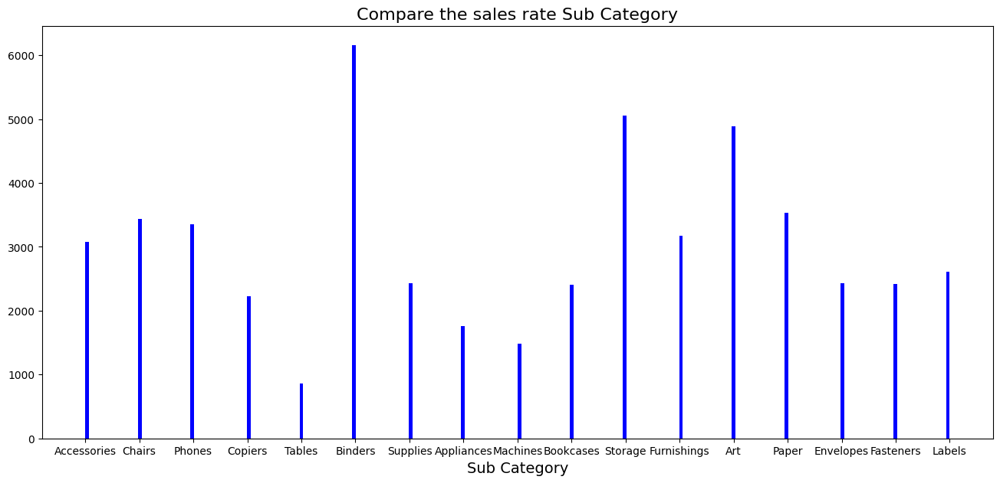

In [117]:
plt.figure(figsize=(16,7))
plt.hist(sales['Sub-Category'],color='blue',bins=230)
plt.title('Compare the sales rate Sub Category',fontsize='16')
plt.xlabel('Sub Category',fontsize='14')
plt.show()

- Top-Selling Category:
    - Tables achieved the highest sales across all seasons, especially in Spring (20,000) and Fall (17,500).

- Lowest-Selling Categories:
    - Accessories and Appliances recorded the lowest sales across all seasons, particularly in Summer (less than 1,000).

- Best Seasons:
    - Spring: Highest overall sales (up to 20,000).
    - Fall: Also strong sales (up to 17,500).

- Worst Season:
    - Summer: Lowest sales compared to other seasons.

- Recommendations:
    - Focus more on Tables to further boost sales.
    - Improve the performance of Accessories and Appliances through promotional offers.
    - Introduce seasonal promotions in Summer to increase sales.

In [118]:
SUB_CATEGORY_WINTER=sales[sales['Season']=='Winter']
SUB_CATEGORY_SUMMER=sales[sales['Season']=='Summer']
SUB_CATEGORY_FALL=sales[sales['Season']=='Fall']
SUB_CATEGORY_SPRING=sales[sales['Season']=='Spring']

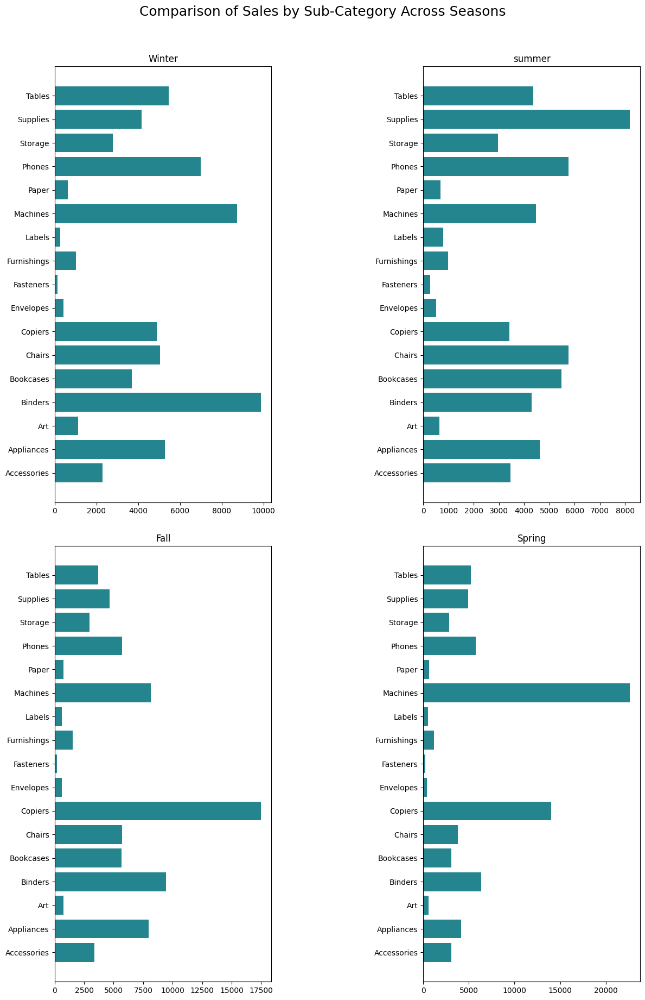

In [119]:

SUB_CATEGORY_WINTER = SUB_CATEGORY_WINTER.sort_values(by='Sub-Category')
SUB_CATEGORY_SUMMER = SUB_CATEGORY_SUMMER.sort_values(by='Sub-Category')
SUB_CATEGORY_FALL = SUB_CATEGORY_FALL.sort_values(by='Sub-Category')
SUB_CATEGORY_SPRING = SUB_CATEGORY_SPRING.sort_values(by='Sub-Category')
fig, axs = plt.subplots(2, 2, figsize=(12, 18))

axs[0, 0].barh(SUB_CATEGORY_WINTER['Sub-Category'], SUB_CATEGORY_WINTER['Sales'], color=viridis_colors[4])
axs[0, 0].set_title('Winter')

axs[0, 1].barh(SUB_CATEGORY_SUMMER['Sub-Category'], SUB_CATEGORY_SUMMER['Sales'], color=viridis_colors[4])
axs[0, 1].set_title('summer')

axs[1, 0].barh(SUB_CATEGORY_FALL['Sub-Category'], SUB_CATEGORY_FALL['Sales'], color=viridis_colors[4])
axs[1, 0].set_title('Fall')

axs[1, 1].barh(SUB_CATEGORY_SPRING['Sub-Category'], SUB_CATEGORY_SPRING['Sales'], color=viridis_colors[4])
axs[1, 1].set_title('Spring')
plt.suptitle('Comparison of Sales by Sub-Category Across Seasons', fontsize=18, y=1.02)
plt.tight_layout()
plt.subplots_adjust(hspace=0.1, wspace=0.7) 
plt.show()

In [120]:
import plotly.express as px


fig = px.bar(sales, 
                x="Year", 
                y="Sales", 
                color="Sub-Category", 
                barmode="group", 
                title="Comparison of Sales by Year and Sub-Category",
                labels={"Sales": "Total Sales", "Year": "Year", "Sub-Category": "Product Sub-Category"},
                height=600)

fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Total Sales",
    legend_title="Sub-Category",
    font=dict(size=12),
    template="plotly_white" 
)

fig.show()

In [121]:
MARKET_APAC=sales[sales['Market']=='APAC']
MARKET_LATAM=sales[sales['Market']=='LATAM']
MARKET_EU=sales[sales['Market']=='EU']
MARKET_US=sales[sales['Market']=='US']

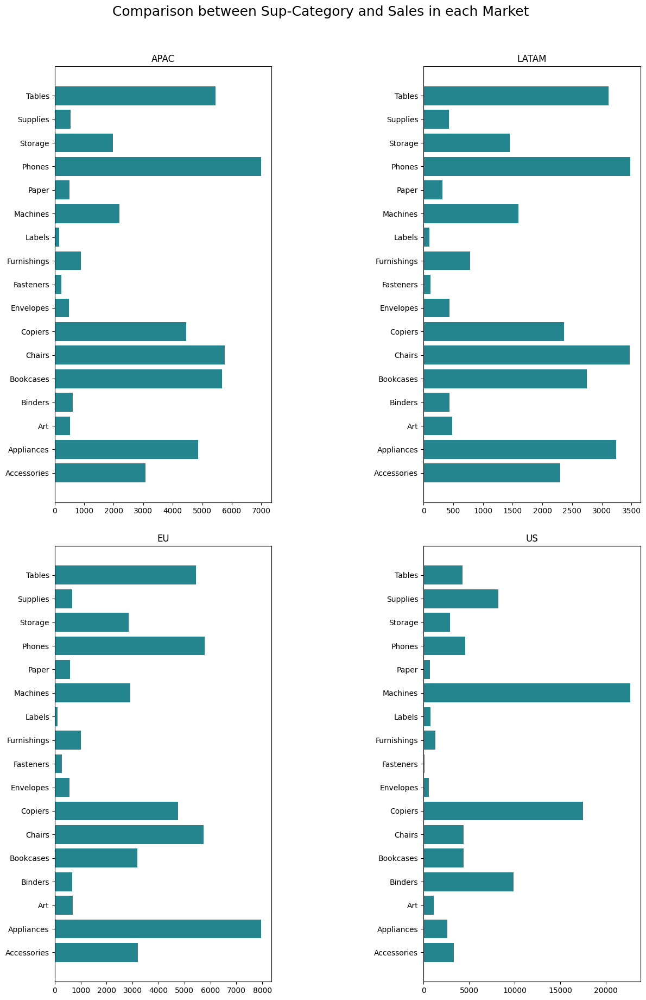

In [122]:

MARKET_APAC = MARKET_APAC.sort_values(by='Sub-Category')
MARKET_LATAM = MARKET_LATAM.sort_values(by='Sub-Category')
MARKET_EU = MARKET_EU.sort_values(by='Sub-Category')
MARKET_US = MARKET_US.sort_values(by='Sub-Category')
fig, axs = plt.subplots(2, 2, figsize=(12, 18))

axs[0, 0].barh(MARKET_APAC['Sub-Category'], MARKET_APAC['Sales'], color=viridis_colors[4])
axs[0, 0].set_title('APAC')

axs[0, 1].barh(MARKET_LATAM['Sub-Category'], MARKET_LATAM['Sales'], color=viridis_colors[4])
axs[0, 1].set_title('LATAM')

axs[1, 0].barh(MARKET_EU['Sub-Category'], MARKET_EU['Sales'], color=viridis_colors[4])
axs[1, 0].set_title('EU')

axs[1, 1].barh(MARKET_US['Sub-Category'], MARKET_US['Sales'], color=viridis_colors[4])
axs[1, 1].set_title('US')
plt.suptitle('Comparison between Sup-Category and Sales in each Market ', fontsize=18, y=1.02)
plt.tight_layout()
plt.subplots_adjust(hspace=0.1, wspace=0.7) 
plt.show()

In [123]:
cities = ['New York City', 'Los Angeles', 'Philadelphia', 'San Francisco', 'Santo Domingo']

EDA_MORE_5_CITIES = sales[sales['City'].isin(cities)]

In [124]:

fig = px.bar(EDA_MORE_5_CITIES, 
             x="Day_of_Week",  
             y="Sales",        
             color="Sub-Category",  
             facet_col="City",     
             barmode="group",       
             title="Comparison of Sales by City, Sub-Category, and Day of Week",
             
             height=600)

fig.update_layout(
    yaxis_title="Total Sales",
    legend_title="Sub-Category",
    font=dict(size=12),
    template="plotly_white" ,
    width=4000
)
# This chart represents the top five cities by sales only

fig.show()

### • Geographical & Market Analysis

> Distribution of Total Sales Over Countries

In [125]:
import plotly.express as px

country_sales = sales.groupby('Country')['Total_sales'].sum().reset_index()

fig = px.choropleth(country_sales, 
                    locations="Country", 
                    locationmode='country names', 
                    color="Total_sales", 
                    hover_name="Country", 
                    color_continuous_scale=px.colors.sequential.Viridis,
                    title="Distribution of Total Sales Over Countries")

fig.show()

> total sales per market
- It seems that total sales are higher in the APAC market 
- Is it the higher profit also, let's check

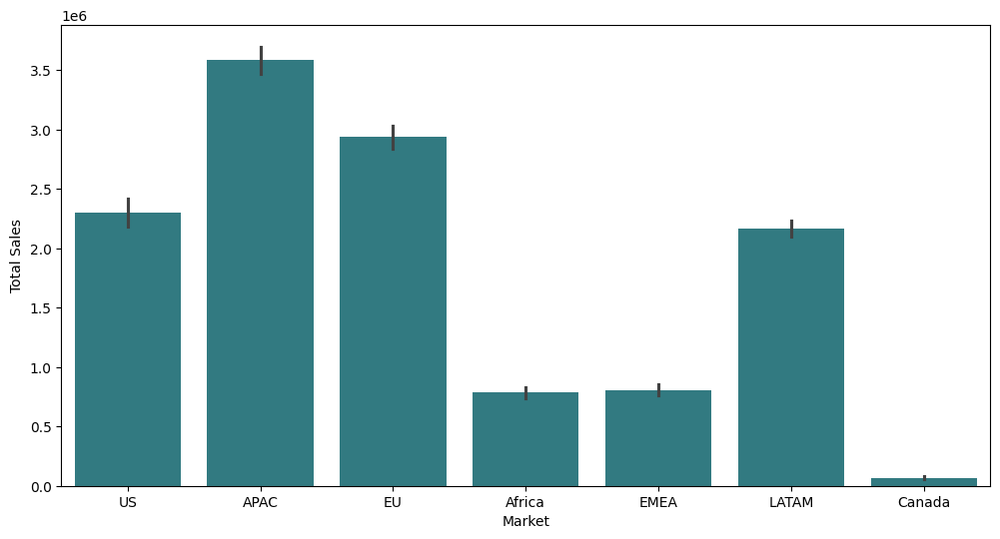

In [126]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Market' ,y='Sales' ,data=sales , estimator=sum,color=viridis_colors[4])
plt.ylabel('Total Sales')
plt.show()

> total profit per market
- YUP, it seems that total profit is higher in the APAC market
- Maybe because thay have higher promotions like discount let's check

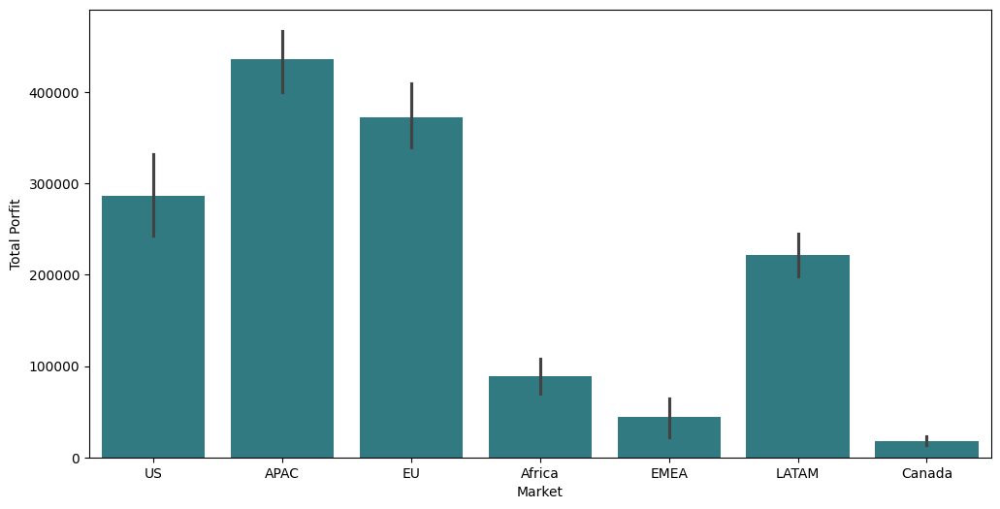

In [127]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Market' ,y='Profit' ,data=sales , estimator=sum, color=viridis_colors[4])
plt.ylabel('Total Porfit')
plt.show()

> total discount per market
- as we see it is promotions are very normal 
- and the EMEA market the has the highest avg discount is the second lowest profit 
- which mean that the more discount are the less profit will be

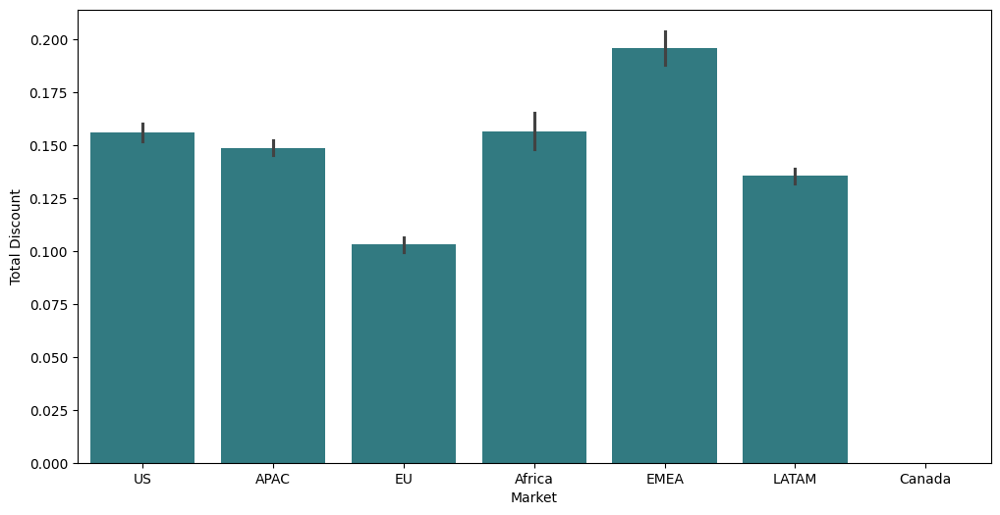

In [128]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Market' ,y='Discount' ,data=sales,color=viridis_colors[4])
plt.ylabel('Total Discount')
plt.show()

> Total Sales by Region for each Gategory
- As we see Technology sales is higher than other categoires In most countries
- And central region is the highst sales

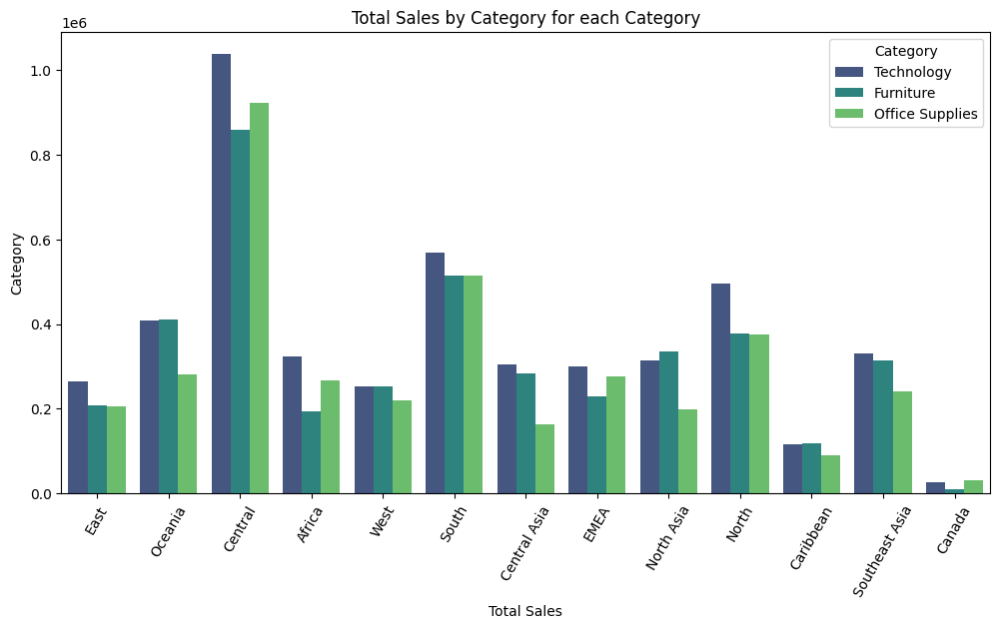

In [129]:
plt.figure(figsize=(12, 6))
sns.barplot(x='Region' ,y='Sales' ,data=sales ,
            estimator=sum ,hue='Category' ,
            ci=False, palette="viridis")


plt.title('Total Sales by Category for each Category')
plt.xlabel('Total Sales')
plt.ylabel('Category')
plt.xticks(rotation=60)
plt.show()

> Total Sales by Region and Season
- Fall is the highest sales over all region.
- Central region dominates sales, especially in Fall.
- South and North regions perform well, peaking in Fall and Summer.
- Africa, EMEA, and Southeast Asia have stable sales across seasons.
- Canada and Caribbean show low sales, possibly due to market size or demand differences.

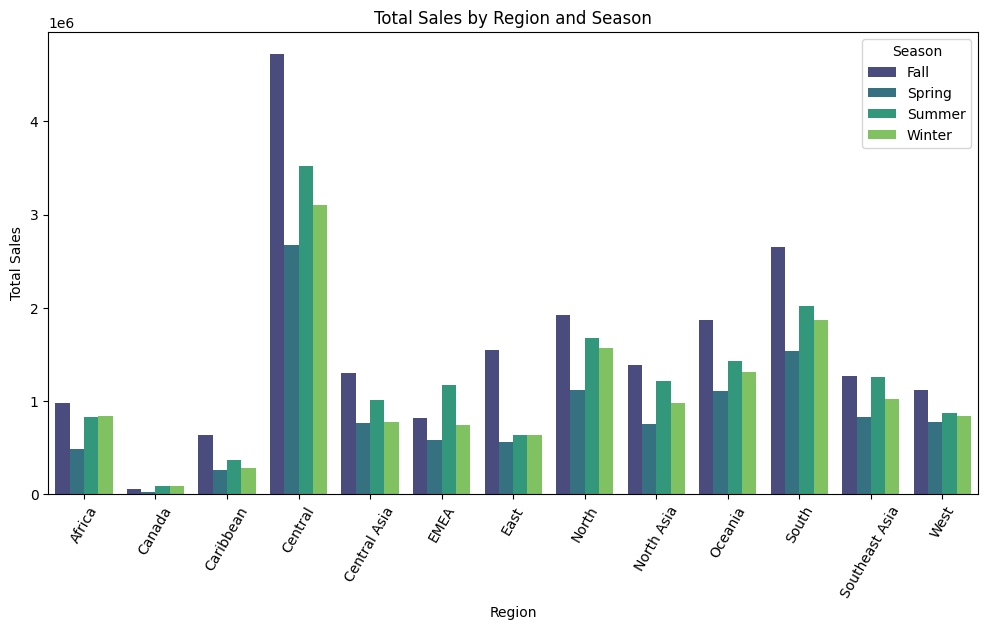

In [130]:
sales_by_region_Season = sales.groupby(['Region', 'Season'])['Total_sales'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Region', y='Total_sales', hue='Season', data=sales_by_region_Season, palette="viridis")
plt.title('Total Sales by Region and Season')
plt.xlabel('Region')
plt.xticks(rotation=60)
plt.ylabel('Total Sales')
plt.legend(title='Season')
plt.show()

> Total Sales by Region and Segment
- Consumer segment dominates across all regions, especially in the Central and South regions.
- Corporate segment follows, performing well in Central, North, and South regions.
- Home Office sales are the lowest but show a stable trend across regions.
- Canada and Caribbean remain low-performing, consistent with previous insights.

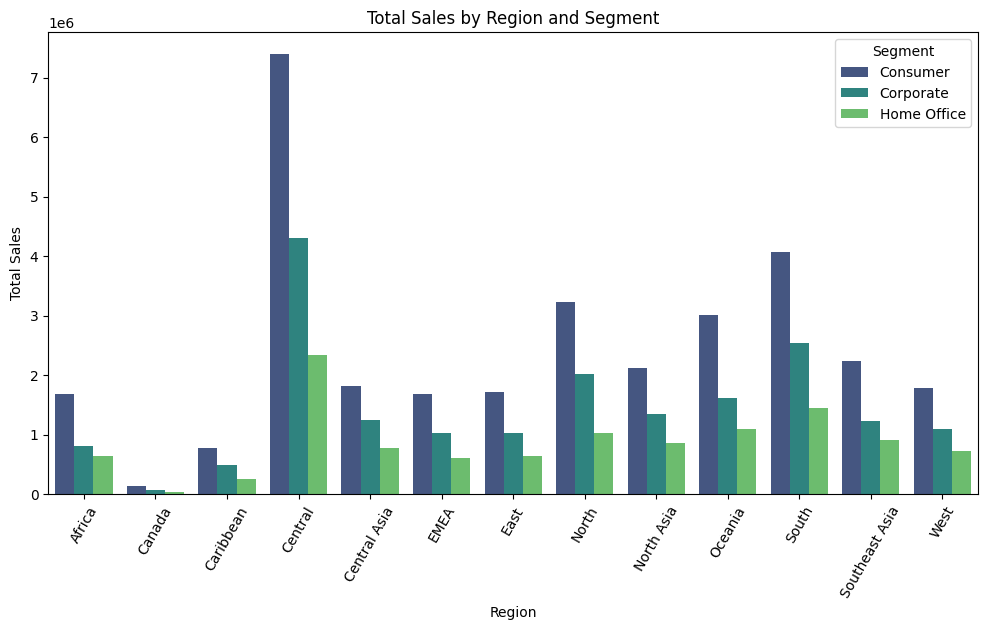

In [131]:
sales_by_region_Segment = sales.groupby(['Region', 'Segment'])['Total_sales'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Region', y='Total_sales', hue='Segment', data=sales_by_region_Segment, palette="viridis")
plt.title('Total Sales by Region and Segment')
plt.xlabel('Region')
plt.xticks(rotation=60)
plt.ylabel('Total Sales')
plt.legend(title='Segment')
plt.show()

### • Seasonal & Trend Analysis

- There is a general upward trend in sales over the long term, with some seasonal fluctuations

In [132]:
long_term_sales = sales.groupby('Order Date')['Sales'].sum().reset_index()
fig = px.line(long_term_sales, x='Order Date', y='Sales', markers=True, 
              title='Long-Term Sales Growth Trends', color_discrete_sequence=px.colors.sequential.Viridis)

fig.update_layout(
    xaxis_title='Order Date',
    yaxis_title='Total Sales',
    title_x=0.5,
    title_font_size=20,
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label="1m", step="month", stepmode="backward"),
                dict(count=6, label="6m", step="month", stepmode="backward"),
                dict(count=1, label="YTD", step="year", stepmode="todate"),
                dict(count=1, label="1y", step="year", stepmode="backward"),
                dict(step="all")
            ])
        ),
        rangeslider=dict(visible=True),
        type="date"
    )
)
fig.show()

- Sales are highest in Fall and lowest in Spring

In [133]:
seasonal_sales = sales.groupby('Season')['Sales'].sum().reset_index()
fig = px.pie(seasonal_sales, values='Sales', names='Season', title='Seasonal Sales Distribution',
                color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(showlegend=True, legend_title_text='Season')
fig.show()

- Sales have been increasing over the years

In [134]:
trend_sales = sales.groupby('Year')['Sales'].sum().reset_index()
fig = px.line(trend_sales, x='Year', y='Sales', markers=True, title='Trend of Sales Over the Years')
fig.show()

- Sales are highest in December and lowest in February

In [135]:
monthly_sales = sales.groupby('Month')['Sales'].sum().reset_index()
fig = px.line(monthly_sales, x='Month', y='Sales', markers=True, title='Monthly Sales Fluctuations')
fig.show()


- Sales are highest on Fridays and lowest on Sundays

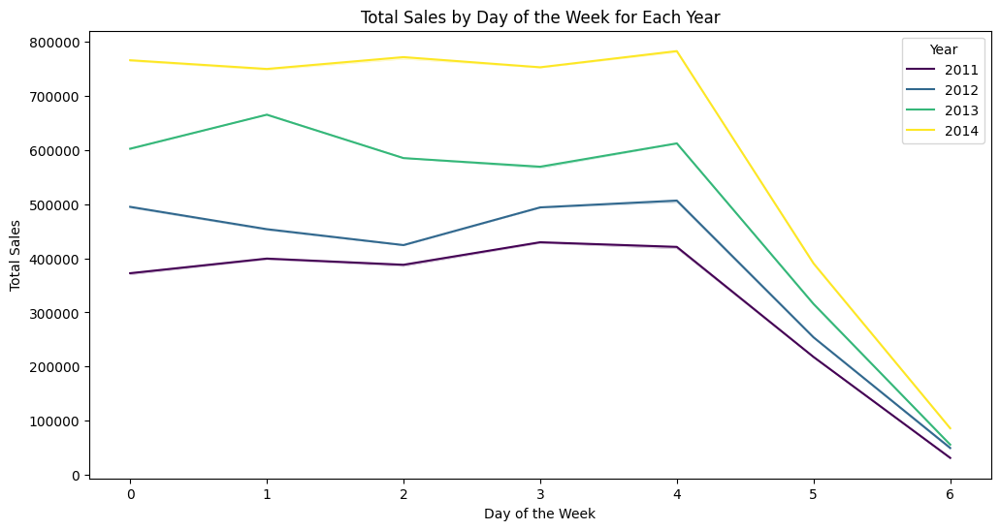

In [136]:
plt.figure(figsize=(12, 6))
sns.lineplot(sales, x='Day_of_Week', y='Sales', hue='Year', errorbar=('ci', False), estimator=sum, palette='viridis')
plt.title('Total Sales by Day of the Week for Each Year')
plt.xlabel('Day of the Week')
plt.ylabel('Total Sales')
plt.show()

- Sales have been increasing over the years in all regions

In [137]:
yearly_sales_region = sales.groupby(['Year', 'Region'])['Sales'].sum().reset_index()
fig = px.line(yearly_sales_region, x='Year', y='Sales', color='Region', markers=True, title='Yearly Sales Trends by Region')
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Total Sales',
    title_x=0.5,
    title_font_size=20
)
fig.show()

- Sales are highest in December and lowest in February

In [189]:
pivot_table = sales.pivot_table(values="Total_sales", index="Year", columns="Month", aggfunc="sum")

fig = px.imshow(pivot_table, labels=dict(x="Month", y="Year", color="Total_sales"), 
                x=pivot_table.columns, y=pivot_table.index, 
                title="Monthly Total_sales Heatmap", 
                color_continuous_scale="Viridis")

fig.update_layout(
    xaxis_title="Month",
    yaxis_title="Year",
    title_x=0.5,
    title_font_size=20
)
fig.show()

> Weekends vs. Weekdays Impact on Sales
- Sales are higher on weekdays compared to weekends

In [188]:
weekend_sales = sales.groupby('Is_Weekend')['Total_sales'].mean().reset_index()
fig = px.pie(weekend_sales, values='Total_sales', names='Is_Weekend', title='Weekends vs. Weekdays Impact on Sales',
                color_discrete_sequence=px.colors.sequential.Viridis)
fig.update_layout(showlegend=True, legend_title_text='Is_Weekend')
fig.show()

### • Profit & Discount Analysis

> Discount Distribution
- Most transactions have no discount, while the rest follow specific discount levels (e.g., 20%, 40%, 60%). 
- Higher discounts are rare, indicating a structured discounting strategy rather than random reductions.

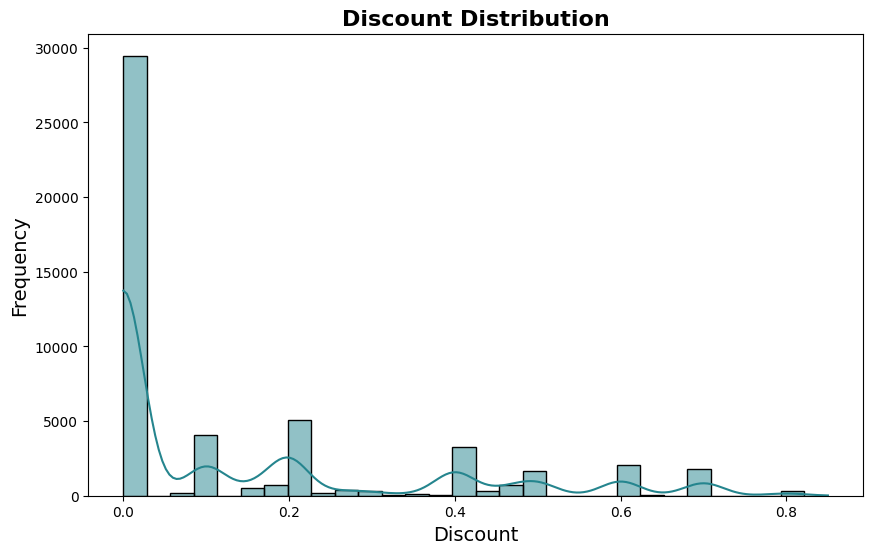

In [140]:
plt.figure(figsize=(10, 6))
sns.histplot(sales['Discount'], bins=30, kde=True, color=viridis_colors[4])
plt.title("Discount Distribution", fontsize=16, fontweight='bold')
plt.xlabel("Discount", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.show()

> Profit vs. Discount Relationship
- Higher discounts are generally associated with lower profits, with many transactions showing losses as the discount increases. 
- Profits are more variable at low or zero discounts, suggesting that discounting negatively impacts profitability.

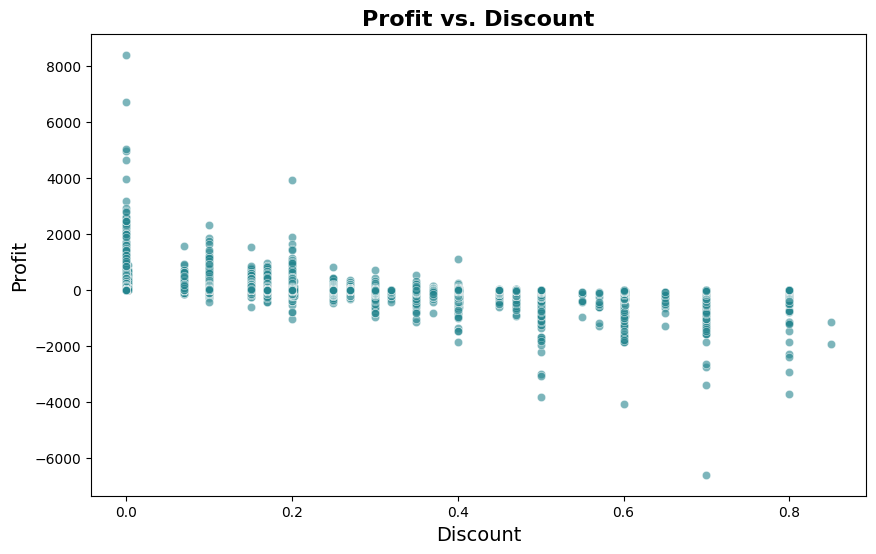

In [141]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=sales['Discount'], y=sales['Profit'], alpha=0.6, color=viridis_colors[4])
plt.title("Profit vs. Discount", fontsize=16, fontweight='bold')
plt.xlabel("Discount", fontsize=14)
plt.ylabel("Profit", fontsize=14)
plt.show()

> Profit & Discount Impact by Product Categories
- Higher discounts tend to reduce profitability across all product categories, with noticeable losses in the Furniture category.
- The Technology category shows the highest profit variability, suggesting that some high-profit transactions occur despite discounts.

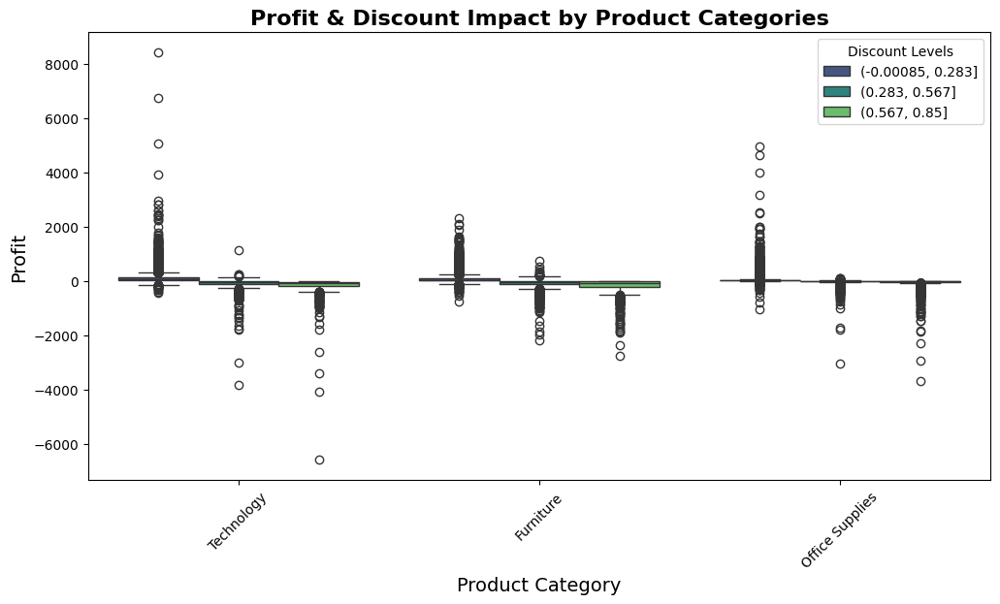

In [142]:
plt.figure(figsize=(12, 6))
sns.boxplot(x="Category", y="Profit", hue=pd.cut(sales["Discount"], bins=3), data=sales, palette="viridis")
plt.title("Profit & Discount Impact by Product Categories", fontsize=16, fontweight='bold')
plt.xlabel("Product Category", fontsize=14)
plt.ylabel("Profit", fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Discount Levels")
plt.show()

> Profitable vs. Non-Profitable Orders by Discount
- Higher discounts significantly decrease the percentage of profitable orders. 
- Orders with the lowest discount range are the most profitable, while those with the highest discounts result in nearly no profitability.

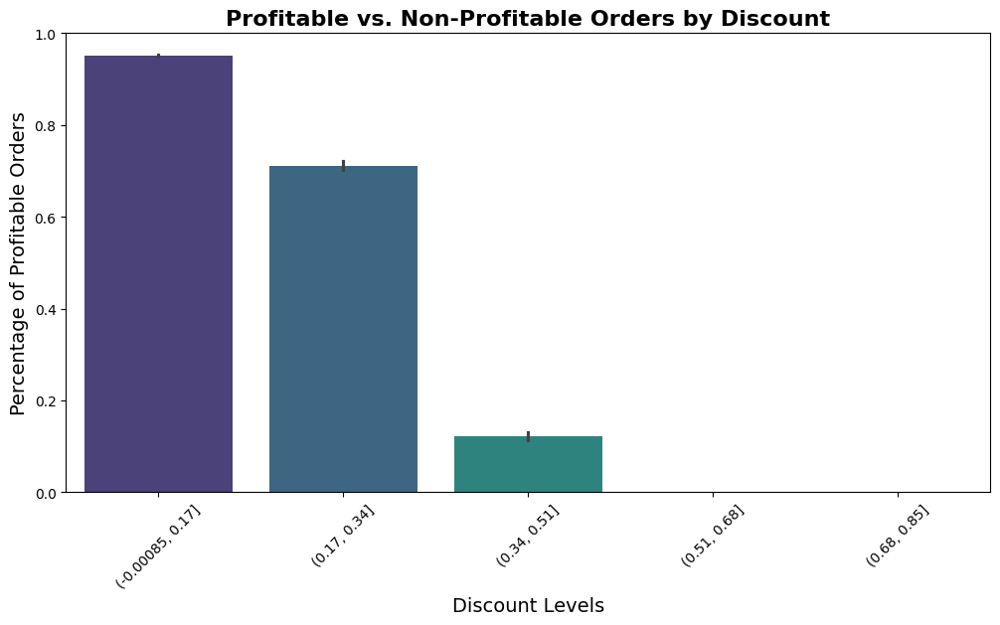

In [143]:
sales["Profitable"] = sales["Profit"] > 0  

plt.figure(figsize=(12, 6))
sns.barplot(x=pd.cut(sales['Discount'], bins=5), y=sales['Profitable'].astype(int), palette="viridis")
plt.title("Profitable vs. Non-Profitable Orders by Discount", fontsize=16, fontweight='bold')
plt.xlabel("Discount Levels", fontsize=14)
plt.ylabel("Percentage of Profitable Orders", fontsize=14)
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()

> Profit and Discount Analysis by Categories & Sub-Categories
- The analysis shows that some sub-categories, such as Tables, have significant losses, while others, like Copiers and Phones, generate the highest profits.
- Technology products generally have higher profitability, while some Furniture sub-categories struggle with losses.

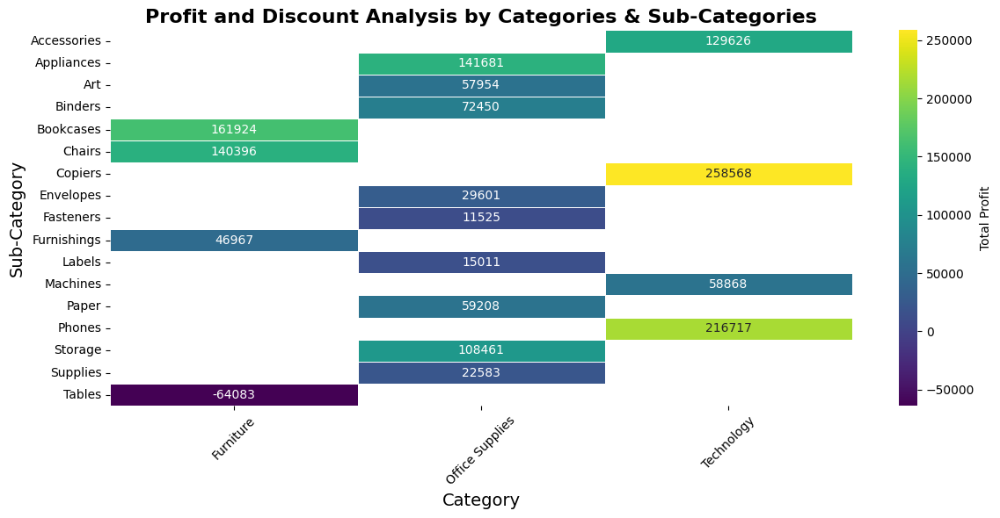

In [144]:
category_profit = sales.groupby(['Category', 'Sub-Category']).agg({"Profit": "sum", "Discount": "mean"}).reset_index()
pivot_table = category_profit.pivot(index="Sub-Category", columns="Category", values="Profit")

plt.figure(figsize=(12, 6))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap="viridis", linewidths=0.5, cbar_kws={'label': 'Total Profit'})
plt.title("Profit and Discount Analysis by Categories & Sub-Categories", fontsize=16, fontweight='bold')
plt.xlabel("Category", fontsize=14)
plt.ylabel("Sub-Category", fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

> Profit and Discount Analysis by Regions
- The chart illustrates the impact of discount levels on total profit across different regions. 
- It is evident that higher discount levels (green bars) lead to significant losses, particularly in Central Asia, North Asia, and Southeast Asia, where profits drop sharply.
- On the other hand, lower discount levels (blue bars) maintain better profitability, suggesting that offering high discounts may negatively impact overall profit in many regions.

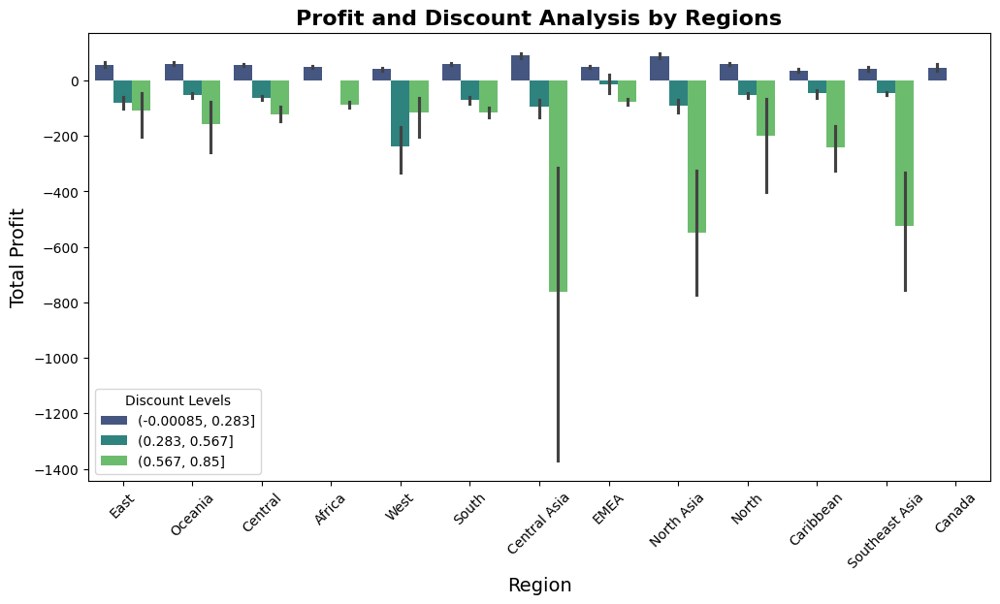

In [145]:
plt.figure(figsize=(12, 6))
sns.barplot(x="Region", y="Profit", hue=pd.cut(sales["Discount"], bins=3), data=sales, palette="viridis")
plt.title("Profit and Discount Analysis by Regions", fontsize=16, fontweight='bold')
plt.xlabel("Region", fontsize=14)
plt.ylabel("Total Profit", fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Discount Levels")
plt.show()

> Profit and Discount Trends Over Time
- Total profit (blue line) shows an overall increasing trend, with periodic fluctuations. Despite some dips, profitability improves significantly towards the end of the timeline.
- Average discount (green line) remains relatively constant and low, suggesting that discount levels did not vary significantly over time.
- This indicates that profit growth was driven by factors other than discounts, such as increased sales volume or better pricing strategies.

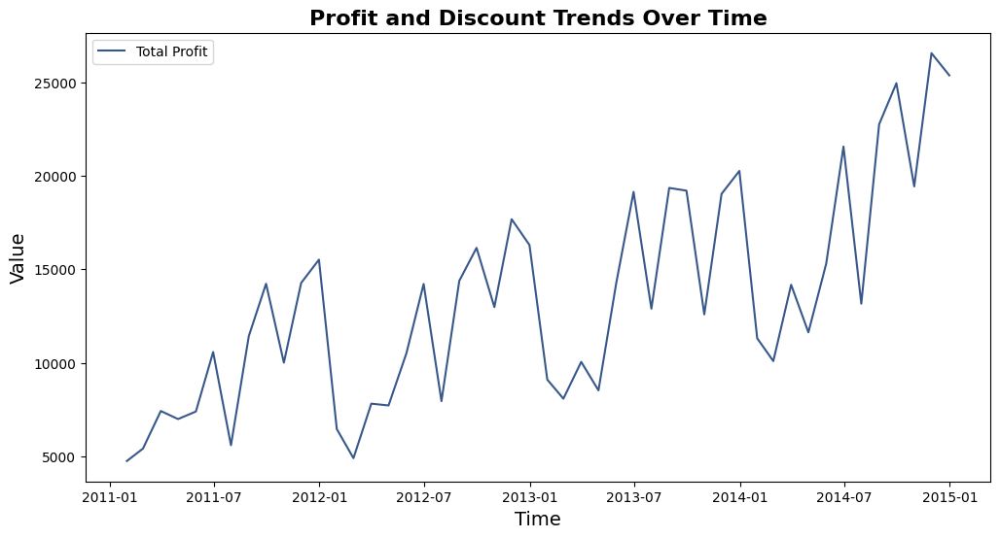

In [190]:
time_profit = sales.resample("M", on="Order Date").agg({"Profit": "sum"}).reset_index()

plt.figure(figsize=(12, 6))
sns.lineplot(x="Order Date", y="Profit", data=time_profit, label="Total Profit", color=viridis_colors[2])
plt.title("Profit and Discount Trends Over Time", fontsize=16, fontweight='bold')
plt.xlabel("Time", fontsize=14)
plt.ylabel("Value", fontsize=14)
plt.legend()
plt.show()

### • Customer & Purchase Behavior Analysis

> Sales by Order Priority
- High and Critical Priority: Contribute the largest percentage to sales.

- Medium Priority: Contribute a moderate percentage.

- Low Priority: Contribute the smallest percentage.

- Profits by Order Priority
  - High and Critical Priority: Contribute the largest percentage to profits.

- Medium Priority: Contribute a moderate percentage.

- Low Priority: Contribute the smallest percentage.

- Recommendations
  - Increase focus on High and Critical priorities to improve sales and profits.

- Analyze reasons for low performance in Low priorities and take actions to improve them.

- Enhance operational processes to ensure speed and quality of service.

In [147]:
order_priority_analysis = sales.groupby('Order Priority')[['Sales', 'Profit']].sum()
order_priority_analysis

,Sales,Profit
Order Priority,,
Critical,9.862355e+05,124224.16428
High,3.807548e+06,420373.51340
Low,5.678259e+05,58655.85098
Medium,7.280892e+06,864203.76262


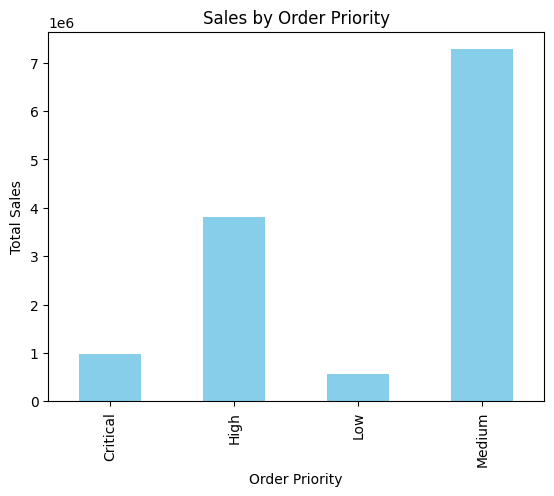

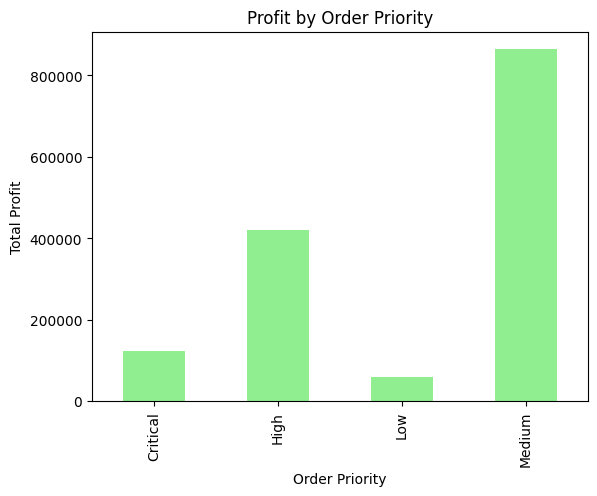

In [148]:
order_priority_analysis['Sales'].plot(kind='bar', color='skyblue', title='Sales by Order Priority')
plt.xlabel('Order Priority')
plt.ylabel('Total Sales')
plt.show()

order_priority_analysis['Profit'].plot(kind='bar', color='lightgreen', title='Profit by Order Priority')
plt.xlabel('Order Priority')
plt.ylabel('Total Profit')
plt.show()

In [149]:
SEGMENT_SALES_DISCOUNT_PROFIT = sales.groupby('Segment')[['Discount', 'Sales', 'Profit']].sum()
SEGMENT_SALES_DISCOUNT_PROFIT

,Discount,Sales,Profit
Segment,,,
Consumer,3808.042,6.507949e+06,749239.78206
Corporate,2205.284,3.824698e+06,441208.32866
Home Office,1316.402,2.309855e+06,277009.18056


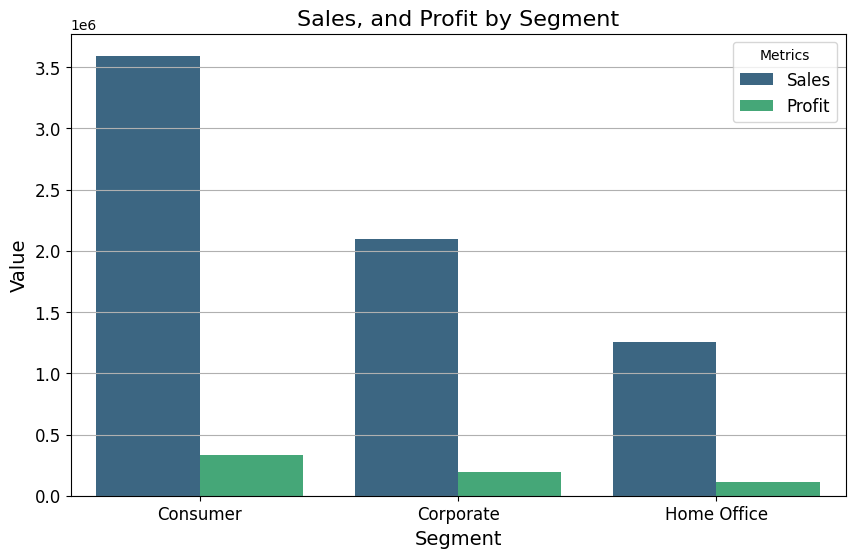

In [191]:
SEGMENT_SALES_DISCOUNT_PROFIT = sales.groupby('Segment')[['Sales', 'Profit']].sum().reset_index()

SEGMENT_SALES_DISCOUNT_PROFIT = pd.melt(
    SEGMENT_SALES_DISCOUNT_PROFIT,
    id_vars=['Segment'], 
    var_name='Metric',    
    value_name='Value'    
)

plt.figure(figsize=(10, 6))
sns.barplot(x='Segment', y='Value', hue='Metric', data=SEGMENT_SALES_DISCOUNT_PROFIT, palette='viridis')

plt.title('Sales, and Profit by Segment', fontsize=16)
plt.xlabel('Segment', fontsize=14)
plt.ylabel('Value', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Metrics', fontsize=12)
plt.grid(True, axis='y')

plt.show()

In [151]:
group_1=sales[(sales['Discount'] / sales['Sales']) <= 0.01]
group_2=sales[(sales['Discount'] / sales['Sales'] > 0.01) & (sales['Discount'] / sales['Sales'] <= 0.07)]
Dis_1=group_1.groupby('Category')[['Sales','Profit']].sum()
Dis_2=group_2.groupby('Category')[['Sales','Profit']].sum()

- This figure shows the purchase rate and the gain when the discount was less than or equal to 1% and when the discount rate was greater than 1% and less than 7%.

In [152]:
import plotly.graph_objects as go

fig = go.Figure()

fig.add_trace(go.Bar(
    x=Dis_1.index,  
    y=Dis_1['Sales'],
    name='Sales (Group 1)',
    marker_color='skyblue'
))
fig.add_trace(go.Bar(
    x=Dis_1.index,
    y=Dis_1['Profit'],
    name='Profit (Group 1)',
    marker_color='lightblue'
))

fig.add_trace(go.Bar(
    x=Dis_2.index,
    y=Dis_2['Sales'],
    name='Sales (Group 2)',
    marker_color='lightgreen'
))
fig.add_trace(go.Bar(
    x=Dis_2.index,
    y=Dis_2['Profit'],
    name='Profit (Group 2)',
    marker_color='limegreen'
))



fig.update_layout(
    barmode='group',  
    title='Sales and Profit by Category and Discount Group',
    xaxis_title='Category',
    yaxis_title='Amount',
    legend_title='Metric and Group',
    template='plotly_white'
)

fig.show()

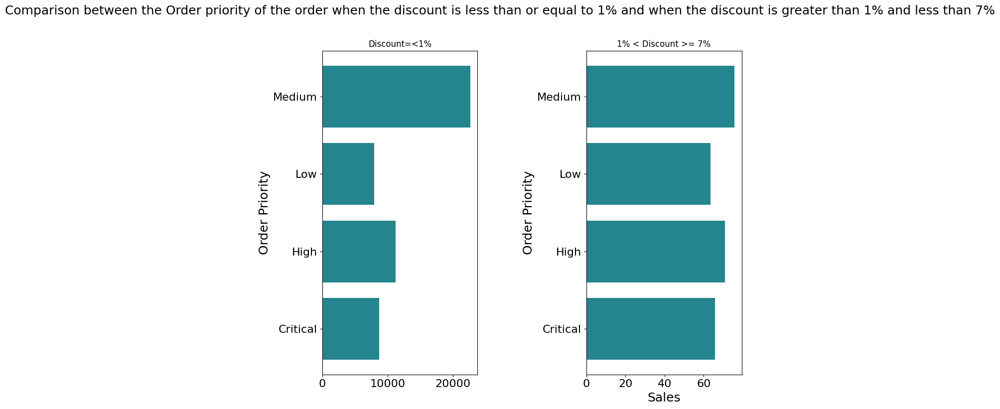

In [153]:
group_1 = group_1.sort_values(by='Order Priority')
group_2 = group_2.sort_values(by='Order Priority')
fig, axs = plt.subplots(1, 2, figsize=(10, 8))

axs[0].barh(group_1['Order Priority'], group_1['Sales'], color=viridis_colors[4])
axs[0].set_title('Discount=<1%')
axs[0].set_ylabel('Order Priority', fontsize=18) 
axs[0].tick_params(axis='both', labelsize=16)
axs[1].barh(group_2['Order Priority'], group_2['Sales'], color=viridis_colors[4])
axs[1].set_title('1% < Discount >= 7%')
axs[1].set_xlabel('Sales', fontsize=18) 
axs[1].set_ylabel('Order Priority', fontsize=18) 
axs[1].tick_params(axis='both', labelsize=16)
plt.suptitle('Comparison between the Order priority of the order when the discount is less than or equal to 1% and when the discount is greater than 1% and less than 7%', fontsize=18, y=1.02)
plt.tight_layout()
plt.subplots_adjust(hspace=0.1, wspace=0.7)
plt.show()
########

> Customer Segmentation Breakdown

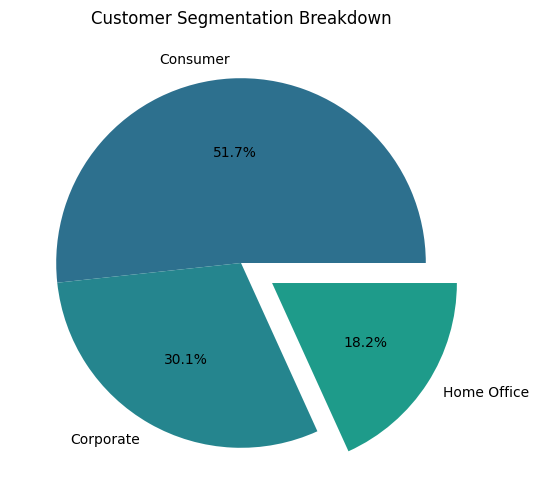

In [154]:
customer_segments = sales["Segment"].value_counts()
explode = (0, 0, 0.2)

plt.figure(figsize=(12, 6))
plt.pie(customer_segments, labels=customer_segments.index, autopct='%1.1f%%', colors=viridis_colors[3:6], explode=explode)
plt.title("Customer Segmentation Breakdown")
plt.show()

### • Shipping & Logistics Analysis

> Profit and Shipping Cost
- This helps determine if higher shipping costs impact profitability

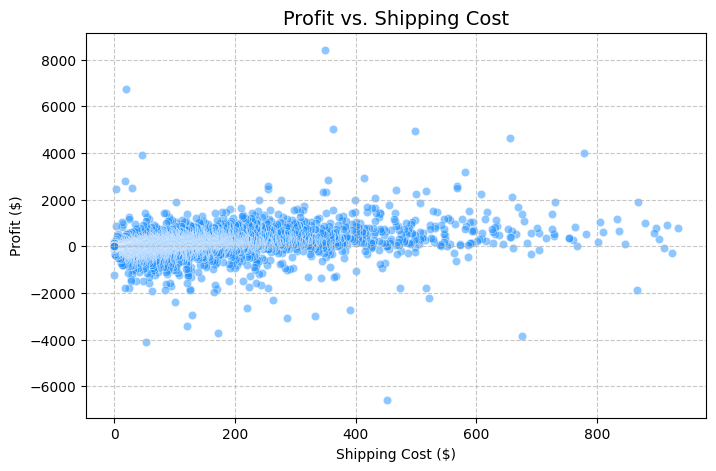

In [155]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=sales, x="Shipping Cost", y="Profit", alpha=0.5, color="#1E90FF")
plt.title("Profit vs. Shipping Cost", fontsize=14)
plt.xlabel("Shipping Cost ($)")
plt.ylabel("Profit ($)")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

> Distribution of Delivery Time
- This shows whether shipping times are consistent or if delays frequently occur.

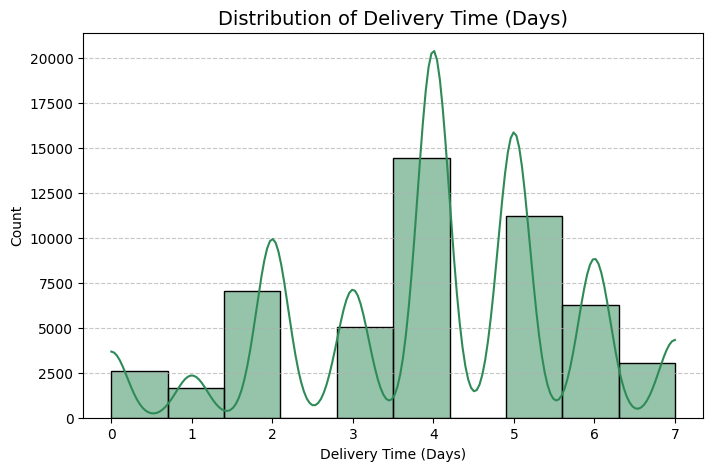

In [156]:
sales["Delivery Time"] = (sales["Ship Date"] - sales["Order Date"]).dt.days

plt.figure(figsize=(8, 5))
sns.histplot(sales["Delivery Time"], bins=10, kde=True, color="#2E8B57")
plt.title("Distribution of Delivery Time (Days)", fontsize=14)
plt.xlabel("Delivery Time (Days)")
plt.ylabel("Count")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

> Average Shipping Cost by Category
- Some categories may require higher shipping costs due to weight, size, or handling requirements.

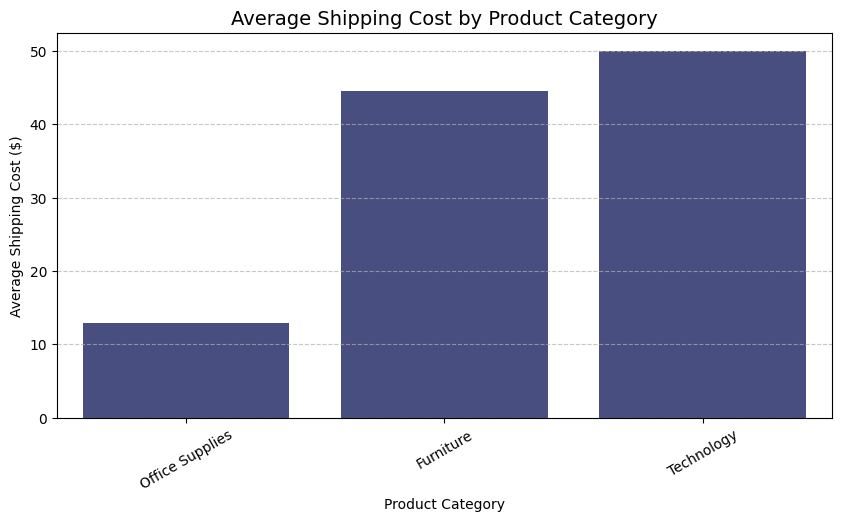

In [157]:
plt.figure(figsize=(10, 5))
category_shipping_cost = sales.groupby("Category")["Shipping Cost"].mean().sort_values()
sns.barplot(x=category_shipping_cost.index, y=category_shipping_cost.values, color= "#3F4788")
plt.title("Average Shipping Cost by Product Category", fontsize=14)
plt.xlabel("Product Category")
plt.ylabel("Average Shipping Cost ($)")
plt.xticks(rotation=30)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

> Shipping Mode Distribution
- The most frequently used shipping method can indicate customer preferences and cost efficiency.

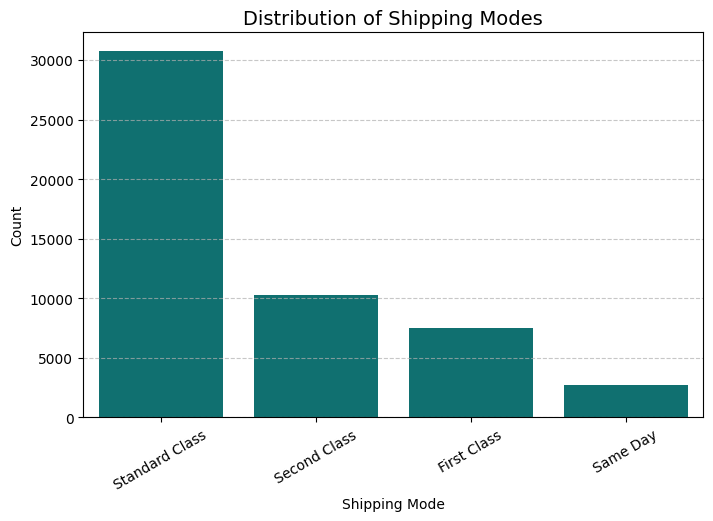

In [158]:

plt.figure(figsize=(8, 5))
sns.countplot(data=sales, x="Ship Mode", order=sales["Ship Mode"].value_counts().index,color = "Teal")
plt.title("Distribution of Shipping Modes", fontsize=14)
plt.xlabel("Shipping Mode")
plt.ylabel("Count")
plt.xticks(rotation=30)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

> Number of Orders by Market
- Understanding which market has the most orders can help in resource allocation.

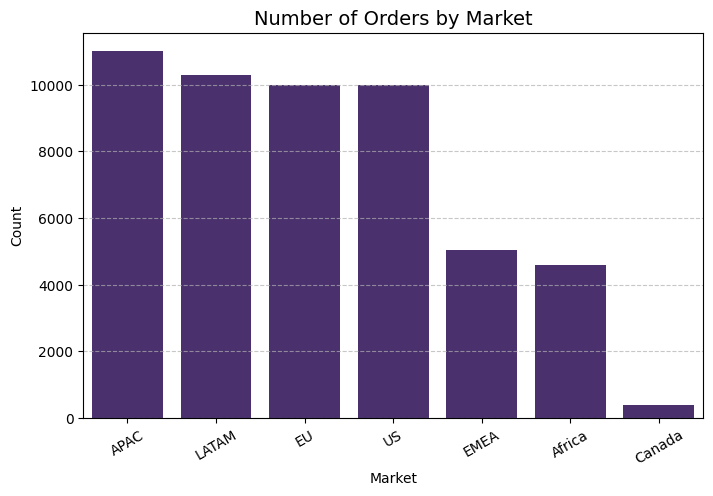

In [159]:
plt.figure(figsize=(8, 5))
sns.countplot(data=sales, x="Market", order=sales["Market"].value_counts().index, color="#482677")
plt.title("Number of Orders by Market", fontsize=14)
plt.xlabel("Market")
plt.ylabel("Count")
plt.xticks(rotation=30)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

> Shipping Cost and Discounts
- This examines whether discounted products tend to have lower or higher shipping costs.

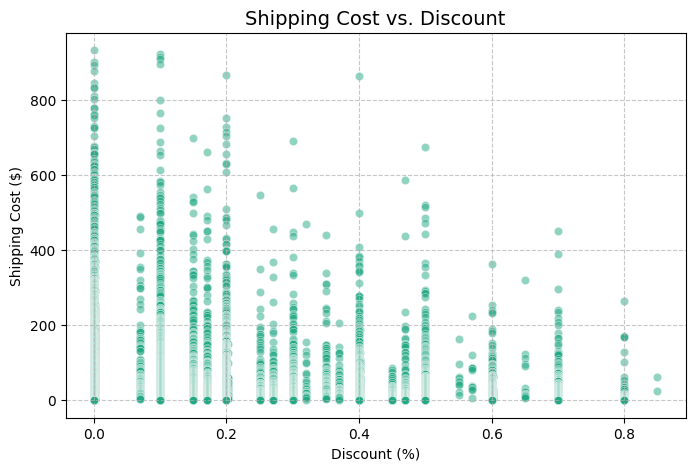

In [160]:
plt.figure(figsize=(8, 5))
sns.scatterplot(data=sales, x="Discount", y="Shipping Cost", alpha=0.5, color="#22A884")
plt.title("Shipping Cost vs. Discount", fontsize=14)
plt.xlabel("Discount (%)")
plt.ylabel("Shipping Cost ($)")
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()


> Top 10 Cities with highest Average Shipping Cost
- Identifying cities with the highest shipping costs can help in optimizing logistics strategies.

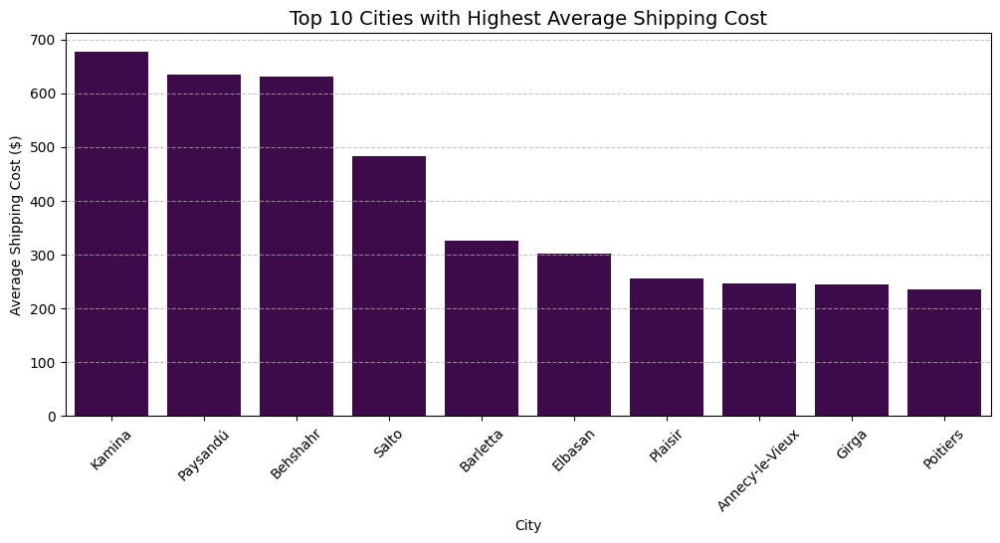

In [161]:
plt.figure(figsize=(12, 5))
top_cities = sales.groupby("City")["Shipping Cost"].mean().nlargest(10)
sns.barplot(x=top_cities.index, y=top_cities.values,color="#440154")
plt.title("Top 10 Cities with Highest Average Shipping Cost", fontsize=14)
plt.xlabel("City")
plt.ylabel("Average Shipping Cost ($)")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

> Order Priority and Shipping Cost
- High-priority orders may be shipped faster but at a higher cost.

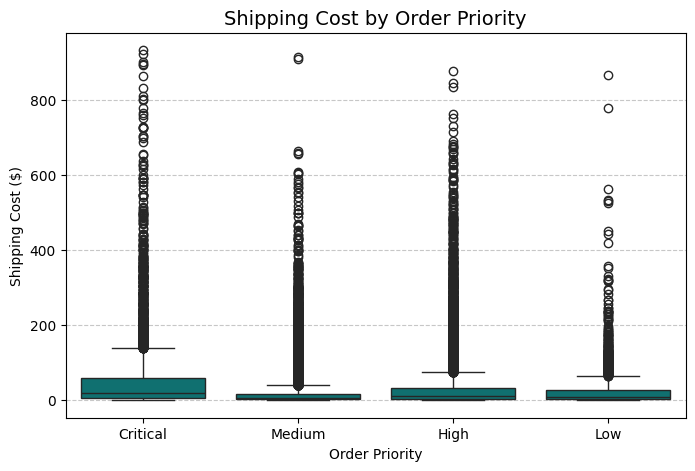

In [162]:
plt.figure(figsize=(8, 5))
sns.boxplot(data=sales, x="Order Priority", y="Shipping Cost",color="Teal")
plt.title("Shipping Cost by Order Priority", fontsize=14)
plt.xlabel("Order Priority")
plt.ylabel("Shipping Cost ($)")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

### • Sales & Quantity Analysis

> Distribution of Order Quantity per Category & Sub-Category
- The average order quantity is relatively consistent across all sub-categories, with minimal variation. 
- Technology and Furniture categories exhibit slightly lower fluctuations compared to Office Supplies, which shows a more stable distribution.

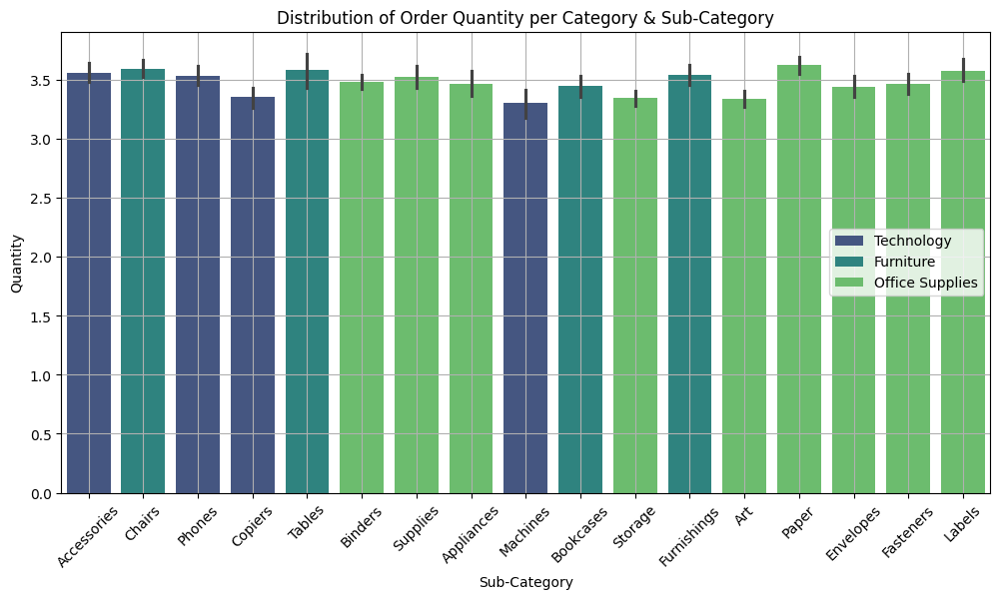

In [163]:
plt.figure(figsize=(12, 6))
sns.barplot(data=sales, x="Sub-Category", y="Quantity", hue="Category", palette="viridis")
plt.title("Distribution of Order Quantity per Category & Sub-Category")
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(loc="right")
plt.show()

> Seasonal Trends in Ordered Quantity
- The total quantity ordered shows an overall upward trend, indicating increasing demand over time. 
- However, there are noticeable seasonal dips, particularly around the beginning of each year, suggesting possible seasonal effects on purchasing behavior.

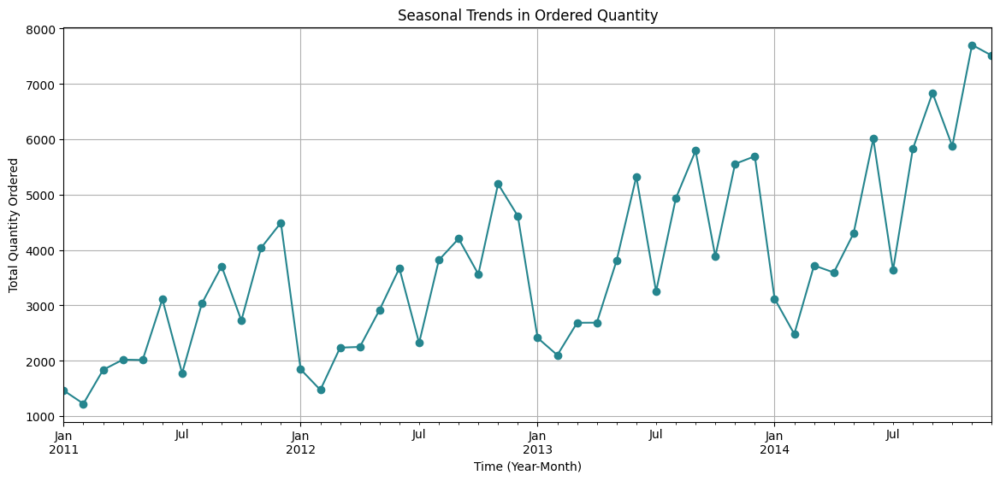

In [164]:
sales["Order Date"] = pd.to_datetime(sales["Order Date"])
sales["Year-Month"] = sales["Order Date"].dt.to_period("M")
quantity_trend = sales.groupby("Year-Month")["Quantity"].sum()

plt.figure(figsize=(14, 6))
quantity_trend.plot(marker="o", linestyle="-", color = viridis_colors[4])
plt.title("Seasonal Trends in Ordered Quantity")
plt.xlabel("Time (Year-Month)")
plt.ylabel("Total Quantity Ordered")
plt.grid(True)
plt.show()

> Quantity Ordered vs. Discount Impact
- The plot suggests that higher discounts do not strongly correlate with an increase in quantity ordered. 
- The red trend line shows a slight negative correlation.
- Indicating that larger discounts might not necessarily lead to higher sales volumes on average.

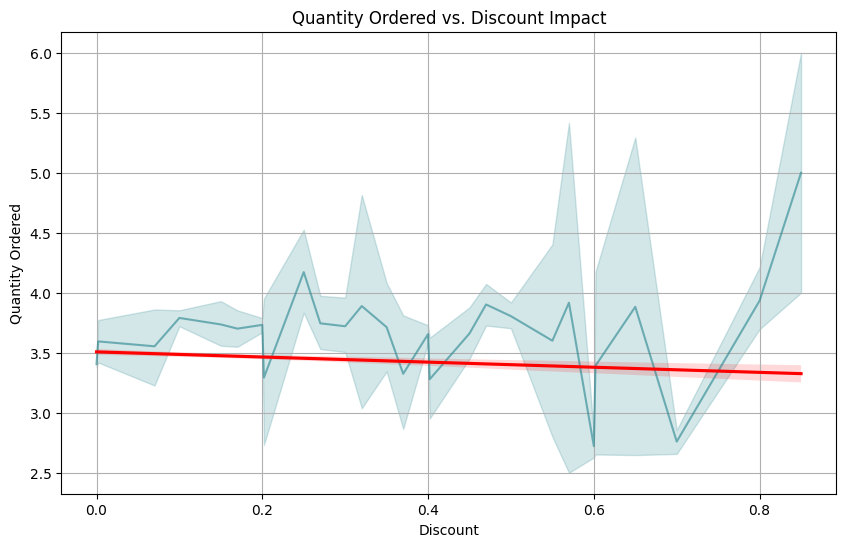

In [165]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=sales, x="Discount", y="Quantity", alpha=0.6, color = viridis_colors[4])
sns.regplot(data=sales, x="Discount", y="Quantity", scatter=False, color="red")
plt.title("Quantity Ordered vs. Discount Impact")
plt.xlabel("Discount")
plt.ylabel("Quantity Ordered")
plt.grid(True)
plt.show()

> Relationship Between Quantity Ordered and Profit
- The scatter plot indicates that there is no strong correlation between quantity ordered and profit. 
- The red trend line remains nearly flat, suggesting that increasing the order quantity does not consistently lead to higher profits. 
- And there are instances of both high profits and significant losses at various order quantities.

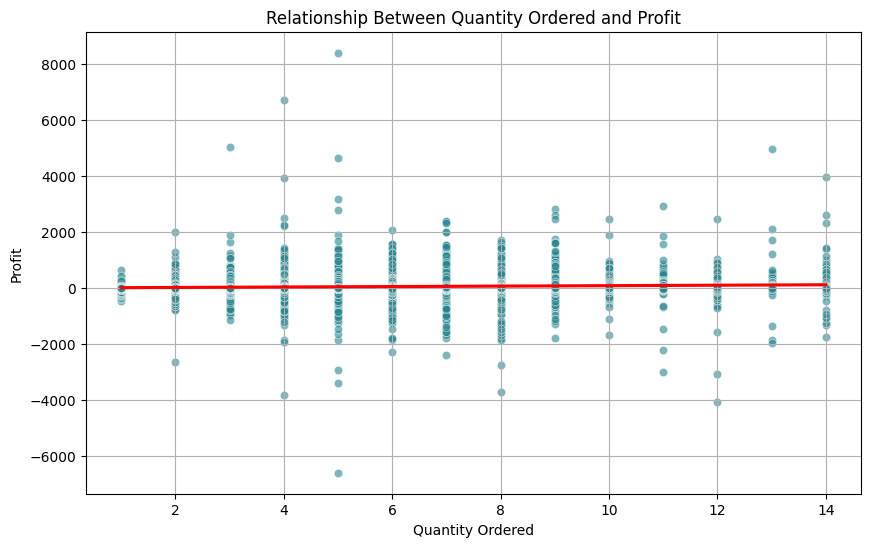

In [166]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=sales, x="Quantity", y="Profit", alpha=0.6, color= viridis_colors[4])
sns.regplot(data=sales, x="Quantity", y="Profit", scatter=False, color="red")
plt.title("Relationship Between Quantity Ordered and Profit")
plt.xlabel("Quantity Ordered")
plt.ylabel("Profit")
plt.grid(True)
plt.show()

# 4. Preprocessing and Feature Engineering:

### • Manage outliers, especially in sales data. 

In [167]:
fig = px.box(sales, x='Shipping Cost', title='Boxplot of Shipping Cost')
fig.show()

In [168]:
Q1 = sales['Shipping Cost'].quantile(0.25)
Q3 = sales['Shipping Cost'].quantile(0.75)
IQR = Q3 - Q1
lower_bound2 = Q1 - 1.5*IQR
upper_bound2 = Q3 + 1.5*IQR
outliers = sales[(sales['Shipping Cost'] < lower_bound2) | (sales['Shipping Cost'] > upper_bound2)]
outliers


,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Year,Day_of_Week,Is_Weekend,Is_Holiday,Season,Total_sales,Shipping Time (Days),Profitable,Delivery Time,Year-Month
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,2012,1,0,0,Summer,16167.5500,0,True,0,2012-07
1,2013-02-05,2013-02-07,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,2013,1,0,0,Winter,33384.5550,2,False,2,2013-02
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,2013,3,0,0,Fall,46576.5390,1,True,1,2013-10
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,2013,0,0,0,Winter,14462.5500,2,False,2,2013-01
4,2013-11-05,2013-11-06,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,2013,1,0,0,Fall,22663.6800,1,True,1,2013-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5904,2011-10-19,2011-10-20,First Class,Justin Ellison,Corporate,Adelaide,South Australia,Australia,APAC,Oceania,...,2011,2,0,0,Fall,1479.1410,1,False,1,2011-10
5905,2014-12-30,2015-01-02,First Class,Harry Marie,Corporate,Basel,Basel-Stadt,Switzerland,EU,Central,...,2014,1,0,0,Winter,454.6800,3,True,3,2014-12
5906,2013-11-17,2013-11-18,First Class,Tracy Collins,Home Office,Shanghai,Shanghai,China,APAC,North Asia,...,2013,6,1,0,Fall,366.8400,1,True,1,2013-11
5907,2012-06-13,2012-06-17,Standard Class,Juliana Krohn,Consumer,Bangkok,Bangkok,Thailand,APAC,Southeast Asia,...,2012,2,0,0,Summer,759.4776,4,False,4,2012-06


In [169]:
sales['Shipping Cost'] = sales['Shipping Cost'].apply(lambda x: sales['Shipping Cost'].mean() if x < lower_bound2 or x > upper_bound2 else x)

fig = px.box(sales, x='Shipping Cost', title='Boxplot of Shipping Cost after Imputation')
fig.show()

In [170]:
fig = px.box(sales, x='Sales', title='Boxplot of Sales')
fig.show()

In [171]:
Q1 = sales['Sales'].quantile(0.25)
Q3 = sales['Sales'].quantile(0.75)
IQR2 = Q3 - Q1
lower_bound2 = Q1 - 1.5*IQR2
upper_bound2 = Q3 + 1.5*IQR2
outliers = sales[(sales['Sales'] < lower_bound2) | (sales['Sales'] > upper_bound2)]
outliers


,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Year,Day_of_Week,Is_Weekend,Is_Holiday,Season,Total_sales,Shipping Time (Days),Profitable,Delivery Time,Year-Month
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,2012,1,0,0,Summer,16167.550,0,True,0,2012-07
1,2013-02-05,2013-02-07,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,2013,1,0,0,Winter,33384.555,2,False,2,2013-02
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,2013,3,0,0,Fall,46576.539,1,True,1,2013-10
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,2013,0,0,0,Winter,14462.550,2,False,2,2013-01
4,2013-11-05,2013-11-06,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,2013,1,0,0,Fall,22663.680,1,True,1,2013-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44220,2012-01-27,2012-02-02,Standard Class,Muhammed Yedwab,Corporate,Xichang,Sichuan,China,APAC,North Asia,...,2012,4,0,0,Winter,14271.390,6,False,6,2012-01
45234,2014-09-15,2014-09-21,Standard Class,Giulietta Weimer,Consumer,Coulommiers,Ile-de-France,France,EU,Central,...,2014,0,0,0,Fall,2472.336,6,True,6,2014-09
45351,2014-10-23,2014-10-26,First Class,Greg Tran,Consumer,Ulm,Baden-Württemberg,Germany,EU,Central,...,2014,3,0,0,Fall,2808.810,3,True,3,2014-10
47131,2014-07-21,2014-07-26,Standard Class,Don Jones,Corporate,Maringá,Parana,Brazil,LATAM,South,...,2014,0,0,0,Summer,1214.720,5,True,5,2014-07


In [172]:

sales['Sales'] = sales['Sales'].apply(lambda x: sales['Sales'].mean() if x <= lower_bound2 or x >= upper_bound2 else x)

fig = px.box(sales, x='Sales', title='Boxplot of Sales after Imputation')
fig.show()

In [173]:
fig = px.box(sales, x = sales['Profit'])
fig.show()

In [174]:
q1 = sales['Profit'].quantile(0.25)
q3 = sales['Profit'].quantile(0.75)
IQR = q3 - q1
lower_bound2 = q1 - 1.5*IQR
upper_bound2 = q3 + 1.5*IQR
outliers = sales[(sales['Profit'] < lower_bound2) | (sales['Profit'] > upper_bound2)]
outliers

print (lower_bound2, upper_bound2)

-55.215 92.025


In [175]:

sales['Profit'] = sales['Profit'].apply(lambda x: sales['Profit'].median() if x < lower_bound2 or x > upper_bound2 else x)

fig = px.box(sales, x='Profit', title='Boxplot of Profit')
fig.show()

In [176]:
fig = px.box(sales, x = sales['Discount'])
fig.show()

In [177]:
q1 = sales['Discount'].quantile(0.25)
q3 = sales['Discount'].quantile(0.75)
IQR = q3 - q1
lower_bound2 = q1 - 1.5*IQR
upper_bound2 = q3 + 1.5*IQR
outliers = sales[(sales['Discount'] < lower_bound2) | (sales['Discount'] > upper_bound2)]
outliers


,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Year,Day_of_Week,Is_Weekend,Is_Holiday,Season,Total_sales,Shipping Time (Days),Profitable,Delivery Time,Year-Month
171,2013-11-26,2013-12-03,Standard Class,Cindy Stewart,Consumer,Lancaster,Ohio,United States,US,East,...,2013,1,0,0,Fall,22499.925,7,False,7,2013-11
245,2014-01-28,2014-01-30,Second Class,Julie Creighton,Corporate,Vilnius,Vilnius,Lithuania,EMEA,EMEA,...,2014,1,0,0,Winter,17369.280,2,False,2,2014-01
289,2012-05-23,2012-05-26,First Class,Sarah Foster,Consumer,Izmir,Izmir,Turkey,EMEA,EMEA,...,2012,2,0,0,Spring,13079.472,3,False,3,2012-05
393,2014-07-14,2014-07-18,Second Class,Michael Moore,Consumer,Le Mans,Pays de la Loire,France,EU,Central,...,2014,0,0,0,Summer,14593.152,4,False,4,2014-07
481,2013-07-29,2013-07-30,First Class,Olvera Toch,Consumer,Bethlehem,Pennsylvania,United States,US,East,...,2013,0,0,0,Summer,8218.584,1,False,1,2013-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51276,2014-06-09,2014-06-13,Standard Class,Dorris liebe,Corporate,Pasadena,Texas,United States,US,Central,...,2014,0,0,0,Summer,3.248,4,False,4,2014-06
51278,2011-09-08,2011-09-10,Second Class,Patrick O'Donnell,Consumer,Lagos,Lagos,Nigeria,Africa,Africa,...,2011,3,0,0,Fall,5.364,2,False,2,2011-09
51279,2011-03-21,2011-03-26,Standard Class,Alejandro Savely,Corporate,Harare,Harare,Zimbabwe,Africa,Africa,...,2011,0,0,0,Spring,19.224,5,False,5,2011-03
51280,2014-11-29,2014-11-30,First Class,Karen Ferguson,Home Office,Midyat,Mardin,Turkey,EMEA,EMEA,...,2014,5,1,0,Fall,204.768,1,False,1,2014-11


In [178]:
sales['Discount'] = sales['Discount'].apply(lambda x: sales['Discount'].median() if x < lower_bound2 or x > upper_bound2 else x)

fig = px.box(sales, x='Discount', title='Boxplot of Discount')
fig.show()

### • Create relevant features like time-based features (e.g., month, week, day), product categories, and promotion flags.

> Data Befor Creating Features

In [179]:
sales = pd.DataFrame(sales)

print("Real Data:")
sales.head()

Real Data:


,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Year,Day_of_Week,Is_Weekend,Is_Holiday,Season,Total_sales,Shipping Time (Days),Profitable,Delivery Time,Year-Month
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,2012,1,0,0,Summer,16167.550,0,True,0,2012-07
1,2013-02-05,2013-02-07,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,2013,1,0,0,Winter,33384.555,2,False,2,2013-02
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,2013,3,0,0,Fall,46576.539,1,True,1,2013-10
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,2013,0,0,0,Winter,14462.550,2,False,2,2013-01
4,2013-11-05,2013-11-06,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,2013,1,0,0,Fall,22663.680,1,True,1,2013-11


> Promotion Flags
- Applying promotion flags creates binary indicators that identify whether a transaction had a discount and whether the discount was above average. This transformation helps in analyzing sales trends and the impact of promotions by distinguishing between discounted and non-discounted transactions.

In [180]:
sales['Promotion_Flag'] = (sales['Discount'] > 0).astype(int)

average_discount = sales['Discount'].mean()
sales['Promotion_Above_Avg'] = (sales['Discount'] > average_discount).astype(int)

print("Data After Promotion Flags:")
sales.head()

Data After Promotion Flags:


,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Is_Weekend,Is_Holiday,Season,Total_sales,Shipping Time (Days),Profitable,Delivery Time,Year-Month,Promotion_Flag,Promotion_Above_Avg
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,0,0,Summer,16167.550,0,True,0,2012-07,0,0
1,2013-02-05,2013-02-07,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,0,0,Winter,33384.555,2,False,2,2013-02,1,1
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,0,0,Fall,46576.539,1,True,1,2013-10,1,1
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,0,0,Winter,14462.550,2,False,2,2013-01,1,1
4,2013-11-05,2013-11-06,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,0,0,Fall,22663.680,1,True,1,2013-11,0,0


> Enhancing Sales Data with Temporal Features
- This code processes sales data by extracting information from the "Order Date" column. First, it converts the date from text to "DateTime" format to make it easier to work with. Then, it extracts the month, week, day of the month, and day of the week from the date. Additionally, it determines the season based on the month and creates a flag to identify holidays (like Christmas or New Year's Day). These steps make it easier to analyze the data over time and understand patterns that impact sales.

In [181]:
# Convert Order Date to DateTime
sales['Order Date'] = pd.to_datetime(sales['Order Date'])

# Convert Ship Date to Date time
sales['Ship Date'] = pd.to_datetime(sales['Ship Date'])

# Extract Months
sales['Month'] = sales['Order Date'].dt.month

# Extract Weeks
sales['Week'] = sales['Order Date'].dt.isocalendar().week

# Extract Day of The Month
sales['Day_of_Month'] = sales['Order Date'].dt.day

# Extract Day of The Week
sales['Day_of_Week'] = sales['Order Date'].dt.dayofweek  # 0 = Monday, 6 = Sunday


# Identify the Seasons
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

sales['Season'] = sales['Order Date'].dt.month.apply(get_season)

# Holiday Flags
holidays = ['12-25', '01-01']  # Christmas and New Year
sales['Holiday'] = sales['Order Date'].dt.strftime('%m-%d').isin(holidays).astype(int)

sales

,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Total_sales,Shipping Time (Days),Profitable,Delivery Time,Year-Month,Promotion_Flag,Promotion_Above_Avg,Week,Day_of_Month,Holiday
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,16167.550,0,True,0,2012-07,0,0,31,31,0
1,2013-02-05,2013-02-07,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,33384.555,2,False,2,2013-02,1,1,6,5,0
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,46576.539,1,True,1,2013-10,1,1,42,17,0
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,14462.550,2,False,2,2013-01,1,1,5,28,0
4,2013-11-05,2013-11-06,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,22663.680,1,True,1,2013-11,0,0,45,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51285,2014-06-19,2014-06-19,Same Day,Katrina Edelman,Corporate,Kure,Hiroshima,Japan,APAC,North Asia,...,325.500,0,True,0,2014-06,0,0,25,19,0
51286,2014-06-20,2014-06-24,Standard Class,Zuschuss Carroll,Consumer,Houston,Texas,United States,US,Central,...,0.444,4,False,4,2014-06,0,0,25,20,0
51287,2013-12-02,2013-12-02,Same Day,Laurel Beltran,Home Office,Oxnard,California,United States,US,West,...,68.760,0,True,0,2013-12,0,0,49,2,0
51288,2012-02-18,2012-02-22,Standard Class,Ross Baird,Home Office,Valinhos,São Paulo,Brazil,LATAM,South,...,26.880,4,True,4,2012-02,0,0,7,18,0


### • Encode categorical variables, normalize numerical features, and create lag features (e.g., sales from the previous month). 

> Appling LabelEncoder to Categorical Columns

In [182]:
encoder = LabelEncoder()

# Columns that Label Encoder will Applied to 
categorical_columns = ["Order Priority", "Ship Mode", "Segment", "Market", "Category", "Sub-Category", "Region", "Season"]

# Appling Label Encoder
for col in categorical_columns:
    sales[col + "_Encoded"] = encoder.fit_transform(sales[col])

# Show Modified Columns
sales[[*categorical_columns, *[col + "_Encoded" for col in categorical_columns]]].head()

,Order Priority,Ship Mode,Segment,Market,Category,Sub-Category,Region,Season,Order Priority_Encoded,Ship Mode_Encoded,Segment_Encoded,Market_Encoded,Category_Encoded,Sub-Category_Encoded,Region_Encoded,Season_Encoded
0,Critical,Same Day,Consumer,US,Technology,Accessories,East,Summer,0,1,0,6,2,0,6,2
1,Critical,Second Class,Corporate,APAC,Furniture,Chairs,Oceania,Winter,0,2,1,0,0,5,9,3
2,Medium,First Class,Consumer,APAC,Technology,Phones,Oceania,Fall,3,0,0,0,2,13,9,0
3,Medium,First Class,Home Office,EU,Technology,Phones,Central,Winter,3,0,2,4,2,13,3,3
4,Critical,Same Day,Consumer,Africa,Technology,Copiers,Africa,Fall,0,1,0,1,2,6,0,0


> Create lag features

In [183]:
sales = sales.sort_index()

# Create lag features
sales['Sales_Lag_1D'] = sales['Sales'].shift(1)   # 1 day before
sales['Sales_Lag_7D'] = sales['Sales'].shift(7)   # 1 week before
sales['Sales_Lag_30D'] = sales['Sales'].shift(30) # 1 month before

sales.head()

,Order Date,Ship Date,Ship Mode,Customer Name,Segment,City,State,Country,Market,Region,...,Ship Mode_Encoded,Segment_Encoded,Market_Encoded,Category_Encoded,Sub-Category_Encoded,Region_Encoded,Season_Encoded,Sales_Lag_1D,Sales_Lag_7D,Sales_Lag_30D
0,2012-07-31,2012-07-31,Same Day,Rick Hansen,Consumer,New York City,New York,United States,US,East,...,1,0,6,2,0,6,2,NaN,NaN,NaN
1,2013-02-05,2013-02-07,Second Class,Justin Ritter,Corporate,Wollongong,New South Wales,Australia,APAC,Oceania,...,2,1,0,0,5,9,3,246.490581,NaN,NaN
2,2013-10-17,2013-10-18,First Class,Craig Reiter,Consumer,Brisbane,Queensland,Australia,APAC,Oceania,...,0,0,0,2,13,9,0,246.490581,NaN,NaN
3,2013-01-28,2013-01-30,First Class,Katherine Murray,Home Office,Berlin,Berlin,Germany,EU,Central,...,0,2,4,2,13,3,3,246.490581,NaN,NaN
4,2013-11-05,2013-11-06,Same Day,Rick Hansen,Consumer,Dakar,Dakar,Senegal,Africa,Africa,...,1,0,1,2,6,0,0,246.490581,NaN,NaN


In [184]:
# Handling Null Values
sales[['Sales_Lag_1D','Sales_Lag_7D','Sales_Lag_30D']] = (
    sales[['Sales_Lag_1D','Sales_Lag_7D','Sales_Lag_30D']].fillna(method='bfill')
)

In [185]:
sales.to_csv("Cleaned Data.csv", encoding='latin-1', index=False)